In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


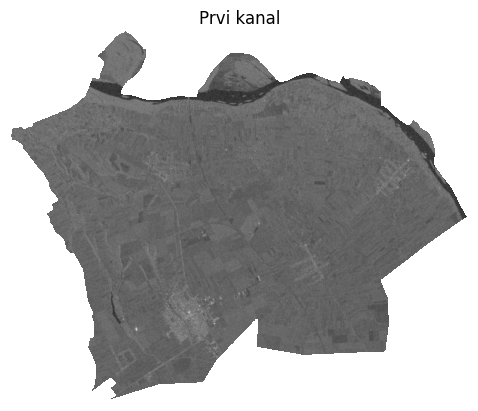

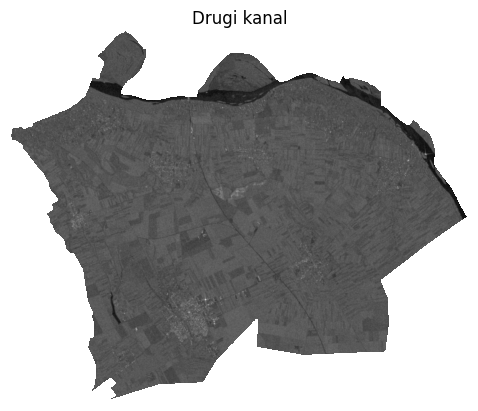

In [ ]:
from osgeo import gdal
import matplotlib.pyplot as plt
import numpy as np

# Putanja snimka
image_path = '/content/drive/My Drive/biosense/m20180105.tif'

ds = gdal.Open(image_path)
image_array = ds.ReadAsArray()

# Prikazivanje prvog kanala
plt.imshow(image_array[0], cmap='gray')
plt.axis('off')
plt.title("Prvi kanal")
plt.show()

# Prikazivanje drugog kanala
plt.imshow(image_array[1], cmap='gray')
plt.axis('off')
plt.title("Drugi kanal")
plt.show()




In [ ]:
!pip install rasterio


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.6/20.6 MB 58.6 MB/s eta 0:00:00


In [ ]:
!pip install fiona


In [ ]:
import geopandas as gpd
import rasterio
from rasterio.mask import mask


In [ ]:
# Učitavanje shapefile-a
shapefile_path = '/content/drive/MyDrive/biosense/clcFINAL.shp'  # Zamijenite putanju sa stvarnom putanjom vašeg shapefile-a
gdf = gpd.read_file('/content/drive/MyDrive/biosense')

# Učitavanje satelitske slike
image_path = '/content/drive/My Drive/biosense/m20180105.tif'  # Zamijenite putanju sa stvarnom putanjom vaše satelitske slike
src = rasterio.open(image_path)


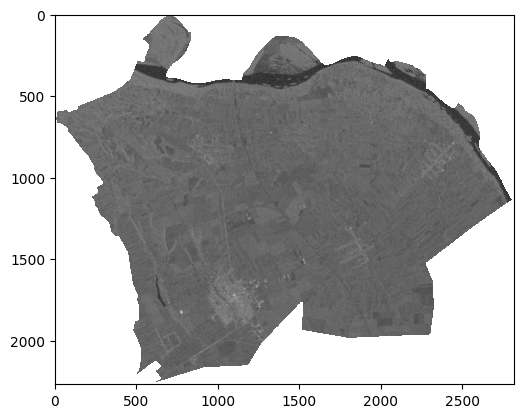

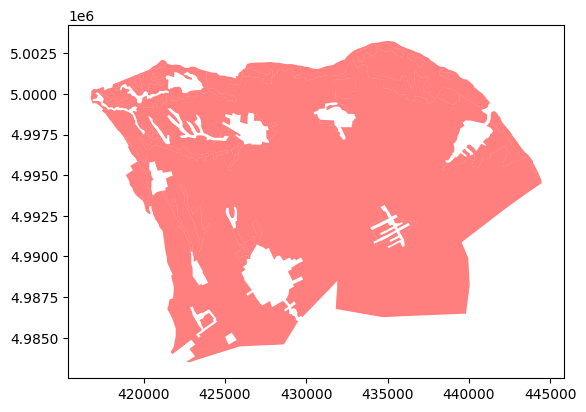

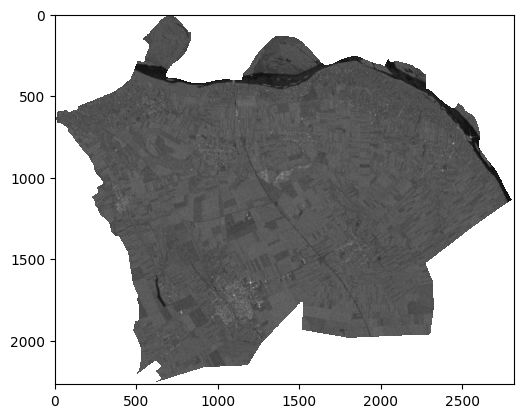

In [ ]:
import geopandas as gpd
import rasterio
from rasterio.plot import show
import matplotlib.pyplot as plt

# Putanje do shapefile i satelitske slike
shapefile_path = '/content/drive/My Drive/biosense/finalshp.shp'
image_path = '/content/drive/My Drive/biosense/m20180105.tif'

# Učitavanje shapefile-a
gdf = gpd.read_file(shapefile_path)

# Učitavanje satelitske slike
src = rasterio.open(image_path)

# Prikazivanje kanala 1 u grayscale boji
show(src.read(1), cmap='gray')

# Prikazivanje shapefile-a
gdf.plot(ax=plt.gca(), color='red', alpha=0.5)  # Dodajte shapefile na isti grafikon

plt.show()

# Prikazivanje kanala 2 u grayscale boji
show(src.read(2), cmap='gray')


plt.show()


In [ ]:
import rasterio

# Putanja do snimka satelita
image_path = '/content/drive/My Drive/biosense/m20180105.tif'  # Zamijenite putanju sa stvarnom putanjom vaše satelitske slike

# Otvorite snimak satelita
with rasterio.open(image_path) as src:
    # Pročitajte i ispišite trenutni CRS
    crs = src.crs
    print("Koordinatni sistem (CRS) snimka satelita:")
    print(crs)


Koordinatni sistem (CRS) snimka satelita:
EPSG:32634


In [ ]:
import geopandas as gpd

# Putanja do shapefile
shapefile_path = '/content/drive/My Drive/biosense/finalshp.shp'  # Zamijenite putanju sa stvarnom putanjom vašeg shapefile-a

# Učitajte shapefile
gdf = gpd.read_file(shapefile_path)

# Ispis trenutnog CRS-a shapefile-a
print("Koordinatni sistem (CRS) shapefile-a:")
print(gdf.crs)


Koordinatni sistem (CRS) shapefile-a:
EPSG:32634


In [ ]:
import geopandas as gpd
import rasterio
from rasterio.mask import mask

# Putanja do shapefile i satelitske slike
shapefile_path = '/content/drive/My Drive/biosense/finalshp.shp'  # Zamijenite putanju sa stvarnom putanjom vašeg shapefile-a
image_path = '/content/drive/My Drive/biosense/m20180105.tif'  # Zamijenite putanju sa stvarnom putanjom vaše satelitske slike
output_path = '/content/drive/My Drive/biosense/m20180105_clipped.tif'  # Putanja za izlaznu isecanu sliku

# Učitavanje shapefile-a
gdf = gpd.read_file(shapefile_path)

# Učitavanje satelitske slike
src = rasterio.open(image_path)

# Isecanje slike na osnovu shapefile-a
clipped_image, transform = mask(src, gdf.geometry, crop=True)

# Informacije o isecanoj slici
new_profile = src.profile.copy()
new_profile.update({
    'height': clipped_image.shape[1],
    'width': clipped_image.shape[2],
    'transform': transform,
    'crs': gdf.crs
})

# Sačuvajte isecanu sliku
with rasterio.open(output_path, 'w', **new_profile) as dst:
    dst.write(clipped_image)

print(f'Isecana slika je sačuvana na: {output_path}')


Isecana slika je sačuvana na: /content/drive/My Drive/biosense/m20180105_clipped.tif


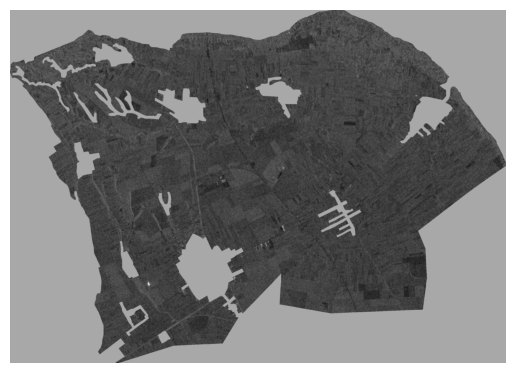

In [ ]:
import geopandas as gpd
import rasterio
from rasterio.mask import mask
import matplotlib.pyplot as plt

# Putanja do shapefile-a i satelitske slike
shapefile_path = '/content/drive/My Drive/biosense/finalshp.shp'
image_path = '/content/drive/My Drive/biosense/m20180105_clipped.tif'

# Učitavanje shapefile-a
gdf = gpd.read_file(shapefile_path)

# Učitavanje isecane slike
with rasterio.open(image_path) as src:
    clipped_image, transform = mask(src, gdf.geometry, crop=True)

# Prikazivanje isecane slike
plt.imshow(clipped_image[0], cmap='gray')
plt.axis('off')  # Isključuje ose
plt.show()


In [ ]:
import rasterio
import pandas as pd

# Putanja do isecenog snimka
iseceni_snimak_path = '/content/drive/My Drive/biosense/m20180105_clipped.tif'
# Otvorite iseceni snimak
with rasterio.open(iseceni_snimak_path) as src:
    # Čitajte sve piksele snimka i pretvorite ih u DataFrame
    iseceni_snimak_data = src.read()
    iseceni_snimak_data = iseceni_snimak_data.reshape((src.count, -1)).T  # Reshape za DataFrame

# Konvertujte podatke u DataFrame
df = pd.DataFrame(iseceni_snimak_data, columns=[f'Band_{i+1}' for i in range(src.count)])

# Prikaz prvih pet redova DataFrame-a
print(df.head())

# Sačuvajte DataFrame u CSV fajl
csv_path = '/content/drive/My Drive/biosense/snimakseceni.csv'
df.to_csv(csv_path, index=False)


   Band_1  Band_2
0     0.0     0.0
1     0.0     0.0
2     0.0     0.0
3     0.0     0.0
4     0.0     0.0


In [ ]:
import pandas as pd

# Putanja do CSV fajla
csv_path = '/content/drive/My Drive/biosense/snimakseceni.csv'  # Zamijenite putanjom do stvarnog CSV fajla

# Učitajte CSV fajl u DataFrame
df = pd.read_csv(csv_path)

# Pronađite minimum i maksimum za svaku kolonu u DataFrame-u
min_vrednosti = df.min()
max_vrednosti = df.max()

# Ispišite minimum i maksimum za svaku kolonu
print("Minimum vrednosti:")
print(min_vrednosti)
print("\nMaksimum vrednosti:")
print(max_vrednosti)


Minimum vrednosti:
Band_1   -26.786518
Band_2   -17.464844
dtype: float64

Maksimum vrednosti:
Band_1    13.989806
Band_2    22.611614
dtype: float64


In [ ]:
import rasterio

# Putanja do isecenog snimka
iseceni_snimak_path = '/content/drive/My Drive/biosense/m20180105_clipped.tif'  # Zamijenite putanjom do stvarnog isecenog snimka

# Otvorite iseceni snimak
with rasterio.open(iseceni_snimak_path) as src:
    # Učitajte metapodatke o snimku
    ukupan_broj_piksela = src.width * src.height

# Ispis ukupnog broja piksela
print(f"Ukupan broj piksela u isecenom snimku: {ukupan_broj_piksela}")


Ukupan broj piksela u isecenom snimku: 5479448


In [ ]:
import pandas as pd

# Putanja do CSV fajla
csv_path = '/content/drive/My Drive/biosense/snimakseceni.csv'  # Zamijenite putanjom do stvarnog CSV fajla

# Učitajte CSV fajl u DataFrame
df = pd.read_csv(csv_path)

# Brojanje piksela sa vrednostima 0 u obe kolone
broj_piksela = len(df[(df['Band_1'] == 0) & (df['Band_2'] == 0)])

# Ispis broja piksela
print(f"Broj piksela sa vrednostima 0 u obe kolone: {broj_piksela}")


Broj piksela sa vrednostima 0 u obe kolone: 2279194


In [ ]:
import os

# Putanja do fascikle sa snimcima na Google Drive File Stream-u
folder_path = '/content/drive/MyDrive/biosense/Upotreba'

# Lista svih snimaka u fascikli
snimci = os.listdir(folder_path)

# Ispis svih snimaka
print(snimci)


['m20180920.tif', 'm20180914.tif', 'm20180908.tif', 'm20180902.tif', 'm20180827.tif', 'm20180405.tif', 'm20180411.tif', 'm20180417.tif', 'm20180423.tif', 'm20180429.tif', 'm20180505.tif', 'm20180511.tif', 'm20180523.tif', 'm20180517.tif', 'm20180529.tif', 'm20180604.tif', 'm20180610.tif', 'm20180616.tif', 'm20180622.tif', 'm20180628.tif', 'm20180704.tif', 'm20180710.tif', 'm20180716.tif', 'm20180722.tif', 'm20180728.tif', 'm20180803.tif', 'm20180809.tif', 'm20180815.tif', 'm20180821.tif', 'm20180926.tif']


Snimak: m20180926
Datum: m20180926
Statistika za prvi kanal:
Minimum: -inf
Maksimum: 16.753524780273438
Srednja vrednost: -inf
Standardna devijacija: nan
Statistika za drugi kanal:
Minimum: -inf
Maksimum: 31.413381576538086
Srednja vrednost: -inf
Standardna devijacija: nan


/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:233: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


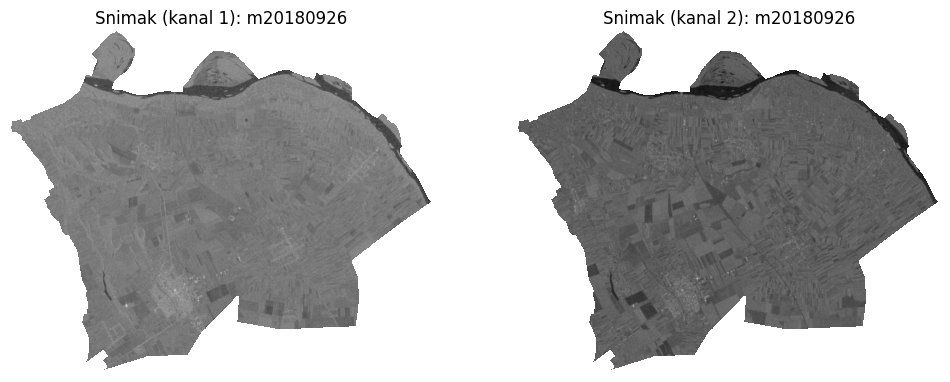

Snimak: m20180926
Datum: m20180926
Statistika za prvi kanal:
Minimum: -inf
Maksimum: 16.730735778808594
Srednja vrednost: -inf
Standardna devijacija: nan
Statistika za drugi kanal:
Minimum: -inf
Maksimum: 28.26266860961914
Srednja vrednost: -inf
Standardna devijacija: nan


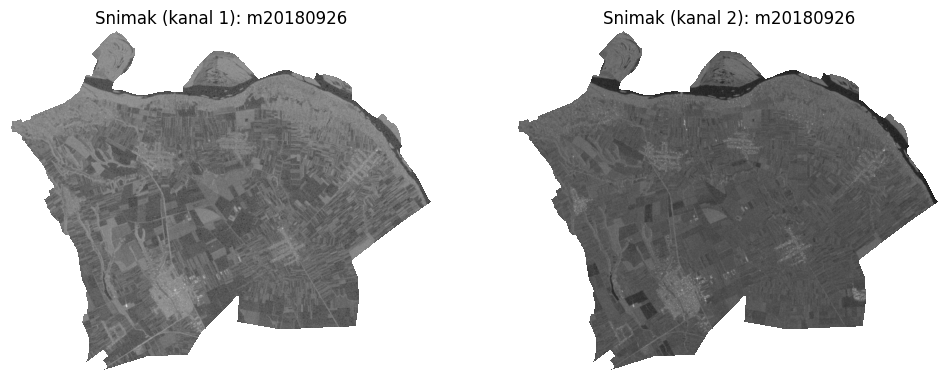

Snimak: m20180926
Datum: m20180926
Statistika za prvi kanal:
Minimum: -inf
Maksimum: 16.87309455871582
Srednja vrednost: -inf
Standardna devijacija: nan
Statistika za drugi kanal:
Minimum: -inf
Maksimum: 27.919662475585938
Srednja vrednost: -inf
Standardna devijacija: nan


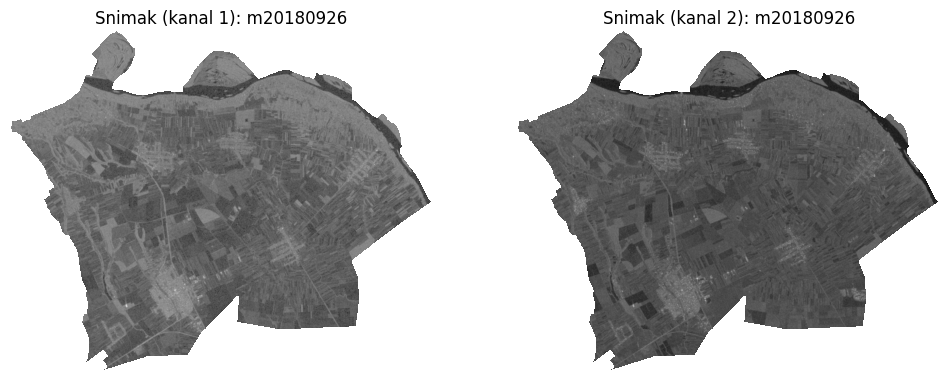

Snimak: m20180926
Datum: m20180926
Statistika za prvi kanal:
Minimum: -inf
Maksimum: 16.018428802490234
Srednja vrednost: -inf
Standardna devijacija: nan
Statistika za drugi kanal:
Minimum: -inf
Maksimum: 26.41413116455078
Srednja vrednost: -inf
Standardna devijacija: nan


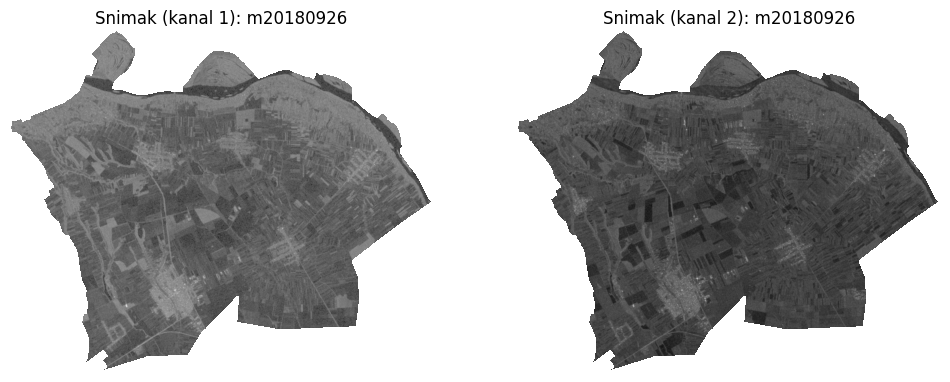

Snimak: m20180926
Datum: m20180926
Statistika za prvi kanal:
Minimum: -inf
Maksimum: 16.63230323791504
Srednja vrednost: -inf
Standardna devijacija: nan
Statistika za drugi kanal:
Minimum: -inf
Maksimum: 28.23439598083496
Srednja vrednost: -inf
Standardna devijacija: nan


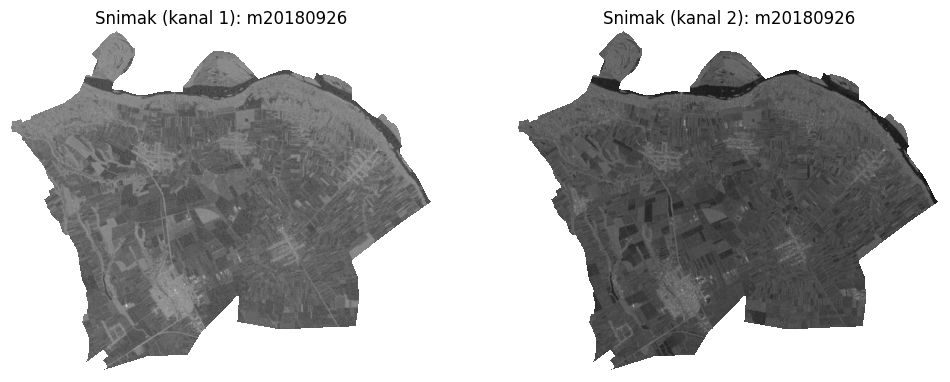

Snimak: m20180926
Datum: m20180926
Statistika za prvi kanal:
Minimum: -inf
Maksimum: 16.341144561767578
Srednja vrednost: -inf
Standardna devijacija: nan
Statistika za drugi kanal:
Minimum: -inf
Maksimum: 26.64281463623047
Srednja vrednost: -inf
Standardna devijacija: nan


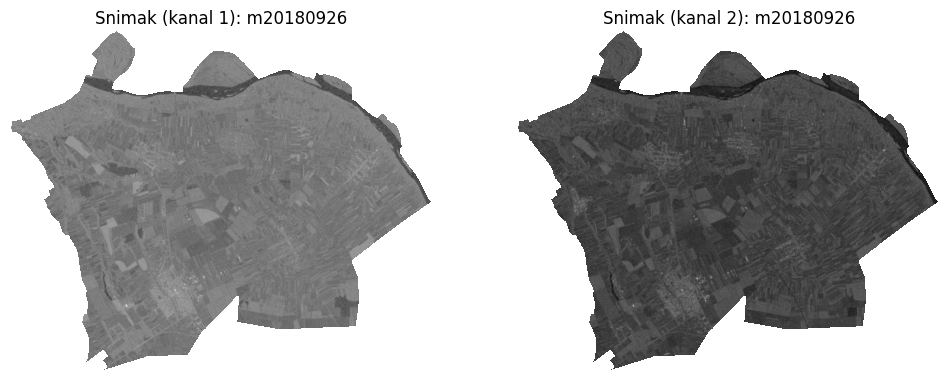

Snimak: m20180926
Datum: m20180926
Statistika za prvi kanal:
Minimum: -inf
Maksimum: 16.327808380126953
Srednja vrednost: -inf
Standardna devijacija: nan
Statistika za drugi kanal:
Minimum: -inf
Maksimum: 25.53838348388672
Srednja vrednost: -inf
Standardna devijacija: nan


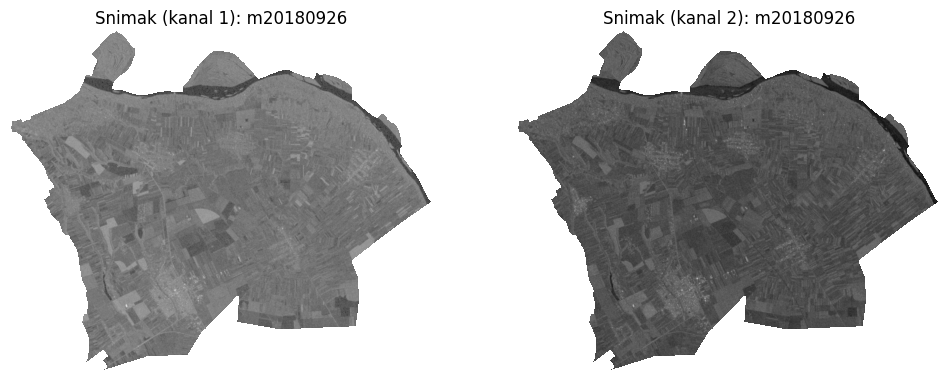

Snimak: m20180926
Datum: m20180926
Statistika za prvi kanal:
Minimum: -inf
Maksimum: 17.03789710998535
Srednja vrednost: -inf
Standardna devijacija: nan
Statistika za drugi kanal:
Minimum: -inf
Maksimum: 24.8751277923584
Srednja vrednost: -inf
Standardna devijacija: nan


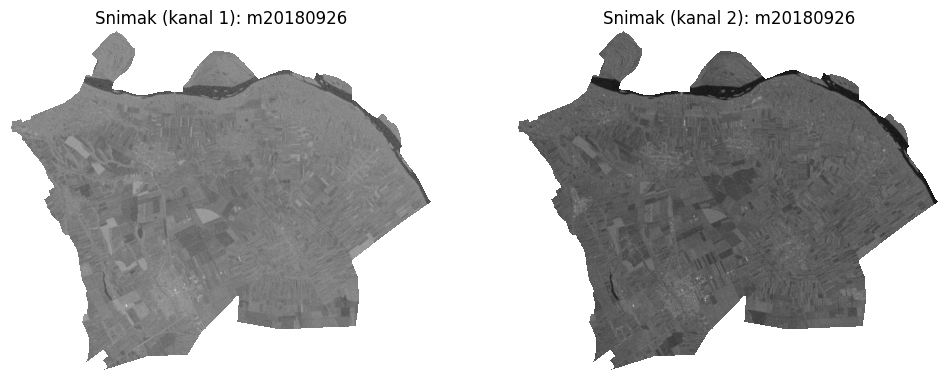

Snimak: m20180926
Datum: m20180926
Statistika za prvi kanal:
Minimum: -inf
Maksimum: 15.661568641662598
Srednja vrednost: -inf
Standardna devijacija: nan
Statistika za drugi kanal:
Minimum: -inf
Maksimum: 25.62496566772461
Srednja vrednost: -inf
Standardna devijacija: nan


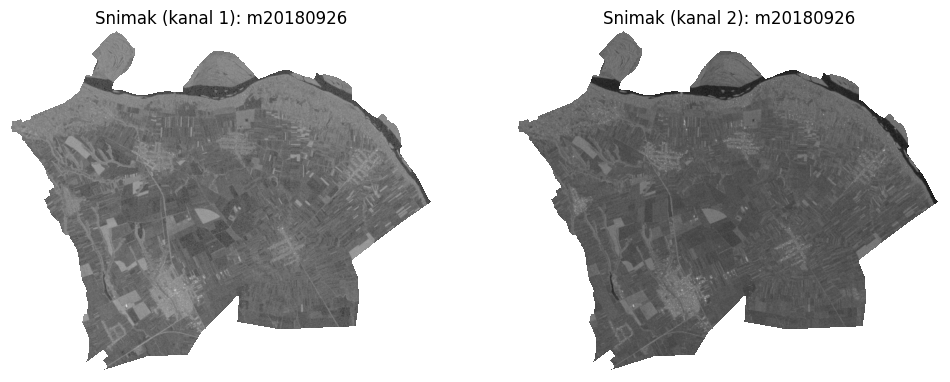

Snimak: m20180926
Datum: m20180926
Statistika za prvi kanal:
Minimum: -inf
Maksimum: 16.20587730407715
Srednja vrednost: -inf
Standardna devijacija: nan
Statistika za drugi kanal:
Minimum: -inf
Maksimum: 30.795095443725586
Srednja vrednost: -inf
Standardna devijacija: nan


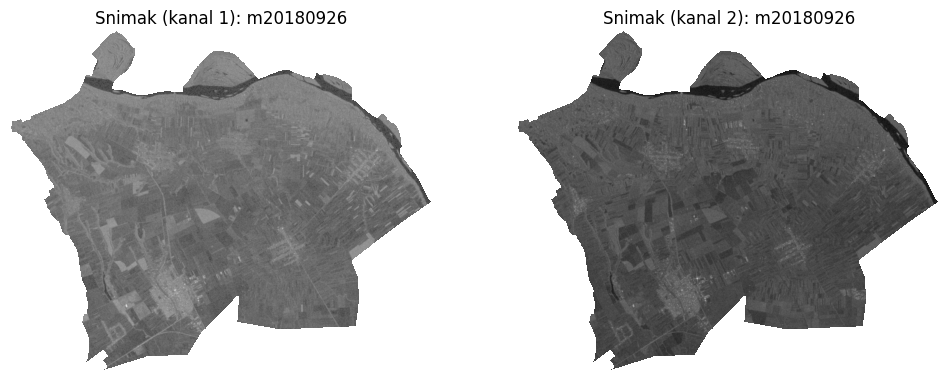

Snimak: m20180926
Datum: m20180926
Statistika za prvi kanal:
Minimum: -inf
Maksimum: 17.748395919799805
Srednja vrednost: -inf
Standardna devijacija: nan
Statistika za drugi kanal:
Minimum: -inf
Maksimum: 26.856613159179688
Srednja vrednost: -inf
Standardna devijacija: nan


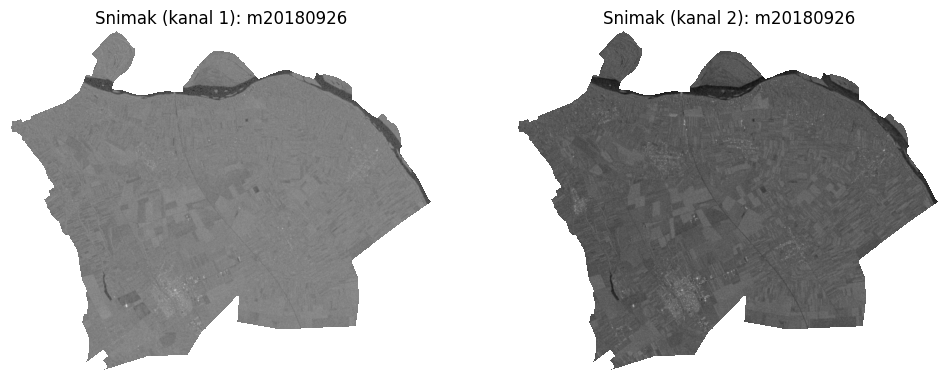

Snimak: m20180926
Datum: m20180926
Statistika za prvi kanal:
Minimum: -inf
Maksimum: 15.940971374511719
Srednja vrednost: -inf
Standardna devijacija: nan
Statistika za drugi kanal:
Minimum: -inf
Maksimum: 31.25105094909668
Srednja vrednost: -inf
Standardna devijacija: nan


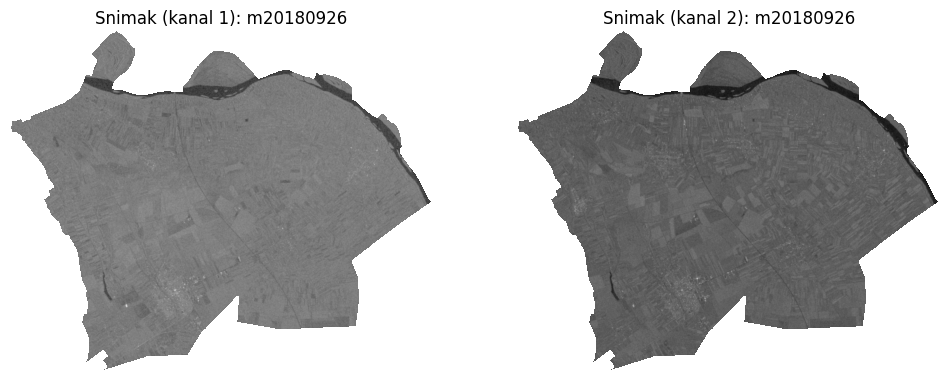

Snimak: m20180926
Datum: m20180926
Statistika za prvi kanal:
Minimum: -inf
Maksimum: 14.574999809265137
Srednja vrednost: -inf
Standardna devijacija: nan
Statistika za drugi kanal:
Minimum: -inf
Maksimum: 28.61098861694336
Srednja vrednost: -inf
Standardna devijacija: nan


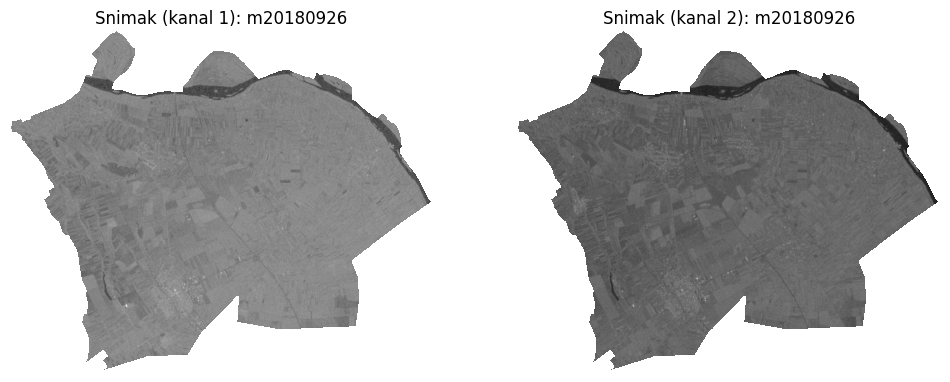

Snimak: m20180926
Datum: m20180926
Statistika za prvi kanal:
Minimum: -inf
Maksimum: 16.462730407714844
Srednja vrednost: -inf
Standardna devijacija: nan
Statistika za drugi kanal:
Minimum: -inf
Maksimum: 25.947452545166016
Srednja vrednost: -inf
Standardna devijacija: nan


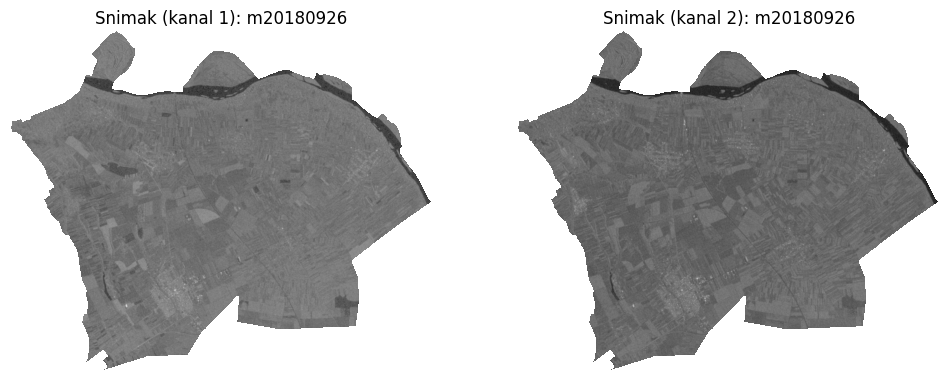

Snimak: m20180926
Datum: m20180926
Statistika za prvi kanal:
Minimum: -inf
Maksimum: 14.328329086303711
Srednja vrednost: -inf
Standardna devijacija: nan
Statistika za drugi kanal:
Minimum: -inf
Maksimum: 26.353303909301758
Srednja vrednost: -inf
Standardna devijacija: nan


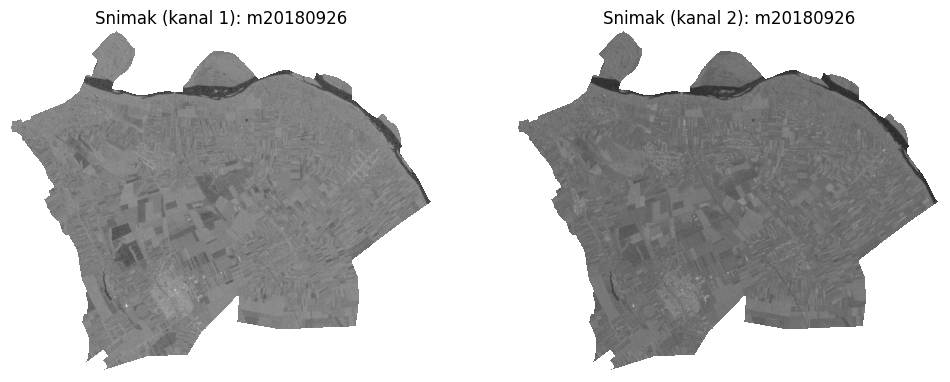

Snimak: m20180926
Datum: m20180926
Statistika za prvi kanal:
Minimum: -inf
Maksimum: 13.470831871032715
Srednja vrednost: -inf
Standardna devijacija: nan
Statistika za drugi kanal:
Minimum: -inf
Maksimum: 27.295848846435547
Srednja vrednost: -inf
Standardna devijacija: nan


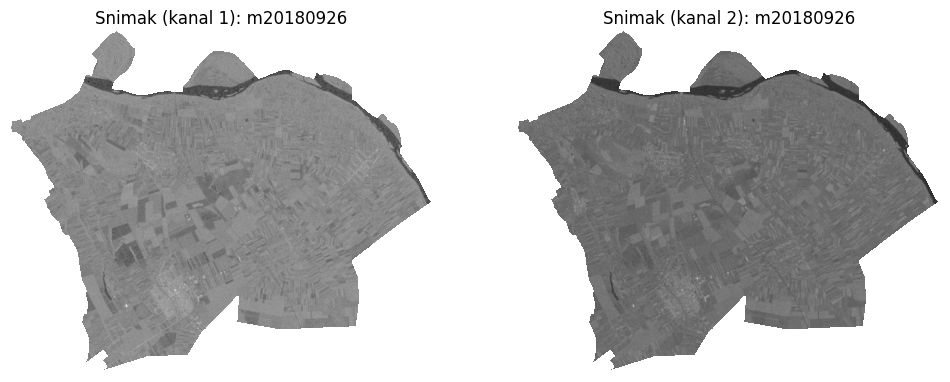

Snimak: m20180926
Datum: m20180926
Statistika za prvi kanal:
Minimum: -inf
Maksimum: 14.676276206970215
Srednja vrednost: -inf
Standardna devijacija: nan
Statistika za drugi kanal:
Minimum: -inf
Maksimum: 28.704030990600586
Srednja vrednost: -inf
Standardna devijacija: nan


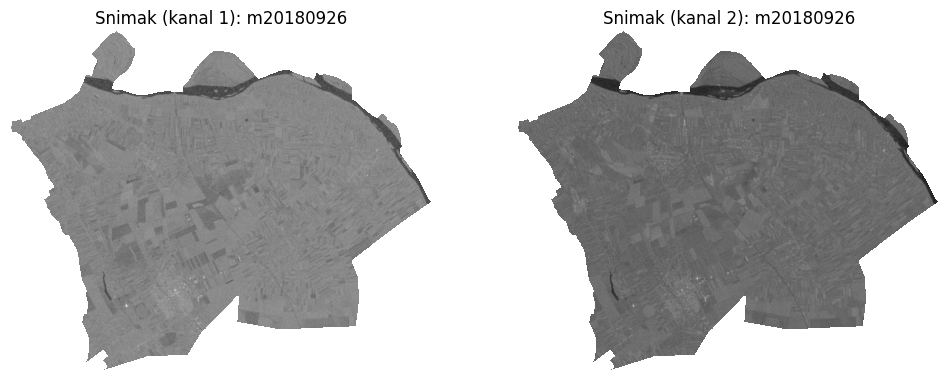

Snimak: m20180926
Datum: m20180926
Statistika za prvi kanal:
Minimum: -inf
Maksimum: 15.080923080444336
Srednja vrednost: -inf
Standardna devijacija: nan
Statistika za drugi kanal:
Minimum: -inf
Maksimum: 26.446659088134766
Srednja vrednost: -inf
Standardna devijacija: nan


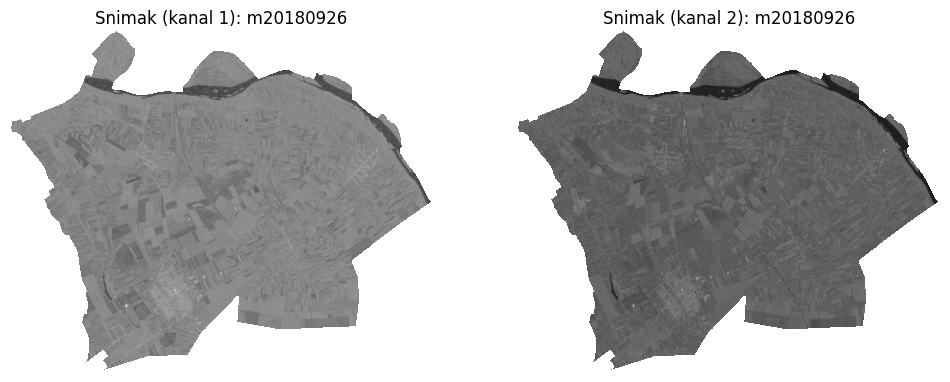

Snimak: m20180926
Datum: m20180926
Statistika za prvi kanal:
Minimum: -inf
Maksimum: 17.012754440307617
Srednja vrednost: -inf
Standardna devijacija: nan
Statistika za drugi kanal:
Minimum: -inf
Maksimum: 31.759239196777344
Srednja vrednost: -inf
Standardna devijacija: nan


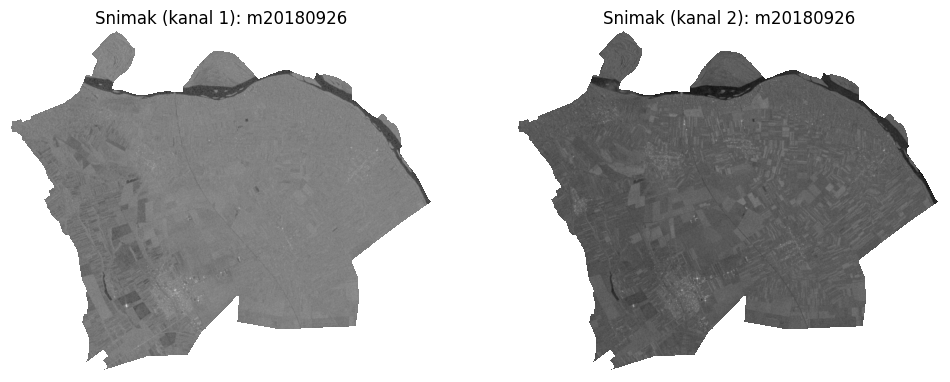

Snimak: m20180926
Datum: m20180926
Statistika za prvi kanal:
Minimum: -inf
Maksimum: 13.979004859924316
Srednja vrednost: -inf
Standardna devijacija: nan
Statistika za drugi kanal:
Minimum: -inf
Maksimum: 26.756803512573242
Srednja vrednost: -inf
Standardna devijacija: nan


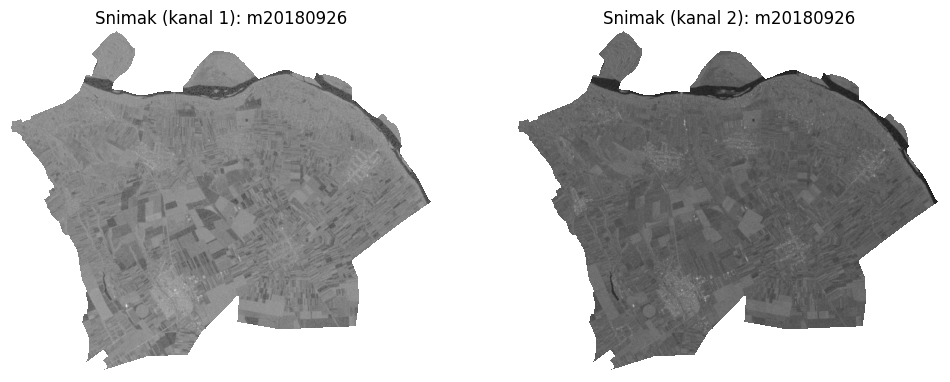

Snimak: m20180926
Datum: m20180926
Statistika za prvi kanal:
Minimum: -inf
Maksimum: 15.307180404663086
Srednja vrednost: -inf
Standardna devijacija: nan
Statistika za drugi kanal:
Minimum: -inf
Maksimum: 26.274700164794922
Srednja vrednost: -inf
Standardna devijacija: nan


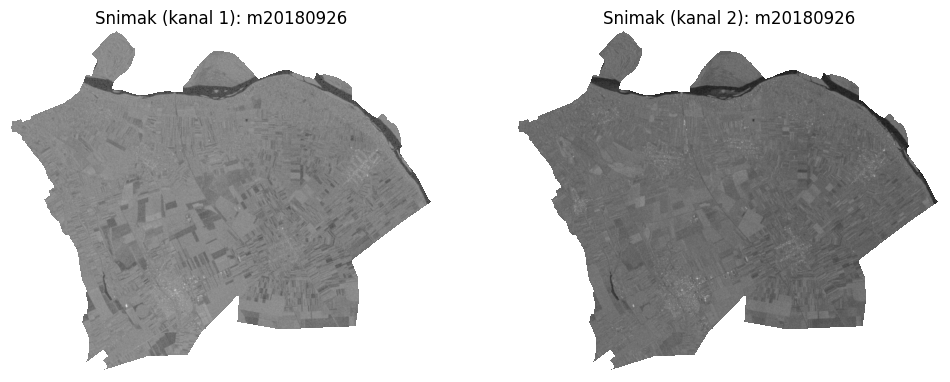

Snimak: m20180926
Datum: m20180926
Statistika za prvi kanal:
Minimum: -inf
Maksimum: 13.815940856933594
Srednja vrednost: -inf
Standardna devijacija: nan
Statistika za drugi kanal:
Minimum: -inf
Maksimum: 27.258525848388672
Srednja vrednost: -inf
Standardna devijacija: nan


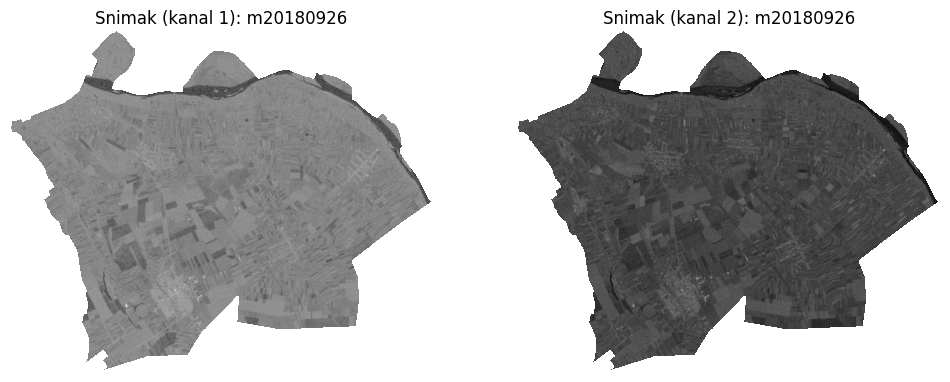

Snimak: m20180926
Datum: m20180926
Statistika za prvi kanal:
Minimum: -inf
Maksimum: 15.417791366577148
Srednja vrednost: -inf
Standardna devijacija: nan
Statistika za drugi kanal:
Minimum: -inf
Maksimum: 25.893917083740234
Srednja vrednost: -inf
Standardna devijacija: nan


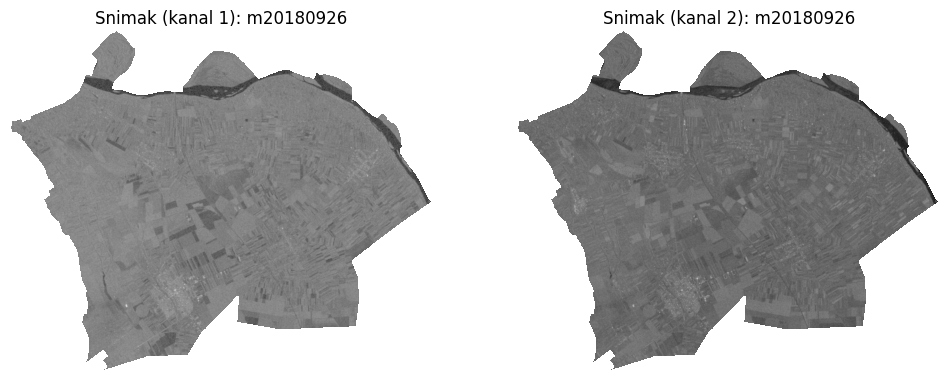

Snimak: m20180926
Datum: m20180926
Statistika za prvi kanal:
Minimum: -inf
Maksimum: 16.661380767822266
Srednja vrednost: -inf
Standardna devijacija: nan
Statistika za drugi kanal:
Minimum: -inf
Maksimum: 27.916484832763672
Srednja vrednost: -inf
Standardna devijacija: nan


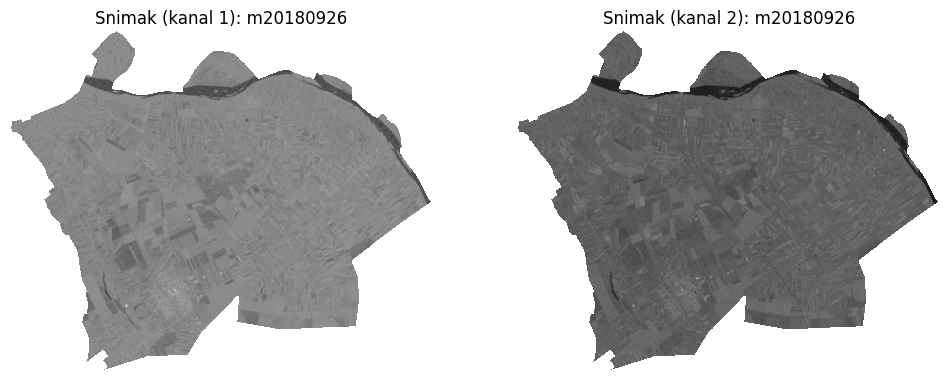

Snimak: m20180926
Datum: m20180926
Statistika za prvi kanal:
Minimum: -inf
Maksimum: 14.157472610473633
Srednja vrednost: -inf
Standardna devijacija: nan
Statistika za drugi kanal:
Minimum: -inf
Maksimum: 26.185771942138672
Srednja vrednost: -inf
Standardna devijacija: nan


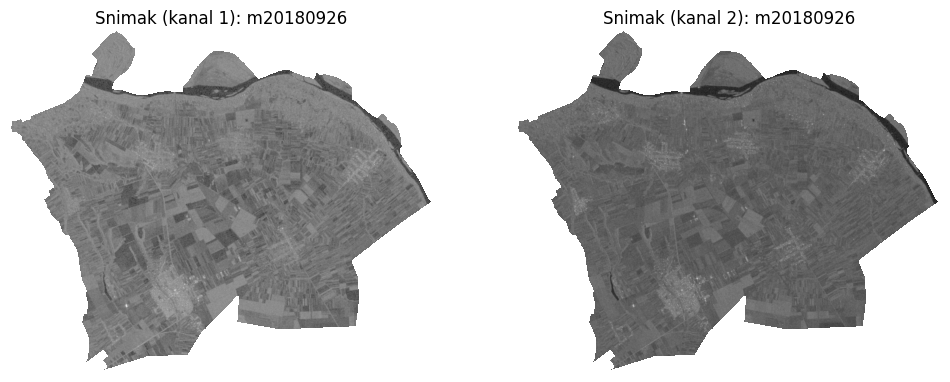

Snimak: m20180926
Datum: m20180926
Statistika za prvi kanal:
Minimum: -inf
Maksimum: 15.19351577758789
Srednja vrednost: -inf
Standardna devijacija: nan
Statistika za drugi kanal:
Minimum: -inf
Maksimum: 21.24420166015625
Srednja vrednost: -inf
Standardna devijacija: nan


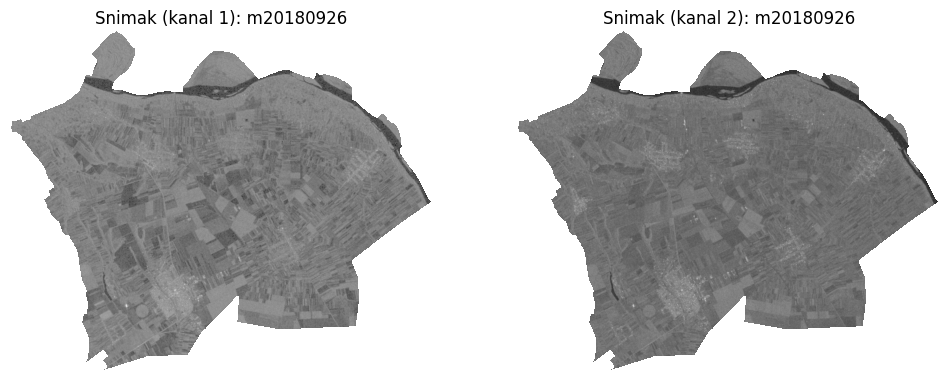

Snimak: m20180926
Datum: m20180926
Statistika za prvi kanal:
Minimum: -inf
Maksimum: 14.885705947875977
Srednja vrednost: -inf
Standardna devijacija: nan
Statistika za drugi kanal:
Minimum: -inf
Maksimum: 27.838773727416992
Srednja vrednost: -inf
Standardna devijacija: nan


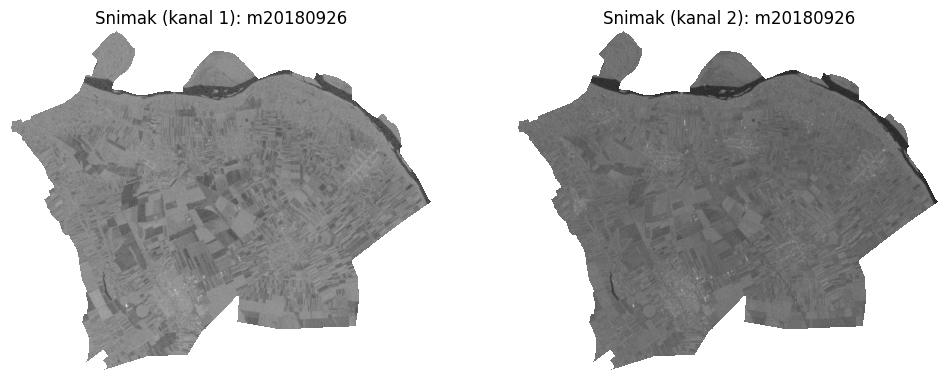

Snimak: m20180926
Datum: m20180926
Statistika za prvi kanal:
Minimum: -inf
Maksimum: 14.053163528442383
Srednja vrednost: -inf
Standardna devijacija: nan
Statistika za drugi kanal:
Minimum: -inf
Maksimum: 29.505638122558594
Srednja vrednost: -inf
Standardna devijacija: nan


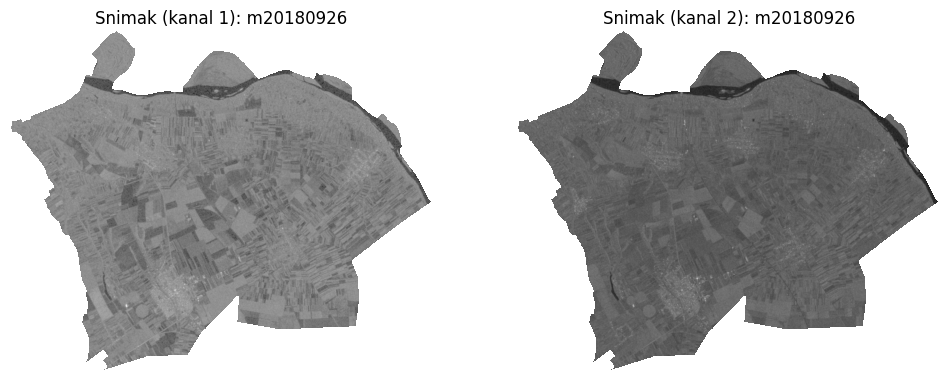

Snimak: m20180926
Datum: m20180926
Statistika za prvi kanal:
Minimum: -inf
Maksimum: 15.617393493652344
Srednja vrednost: -inf
Standardna devijacija: nan
Statistika za drugi kanal:
Minimum: -inf
Maksimum: 29.532691955566406
Srednja vrednost: -inf
Standardna devijacija: nan


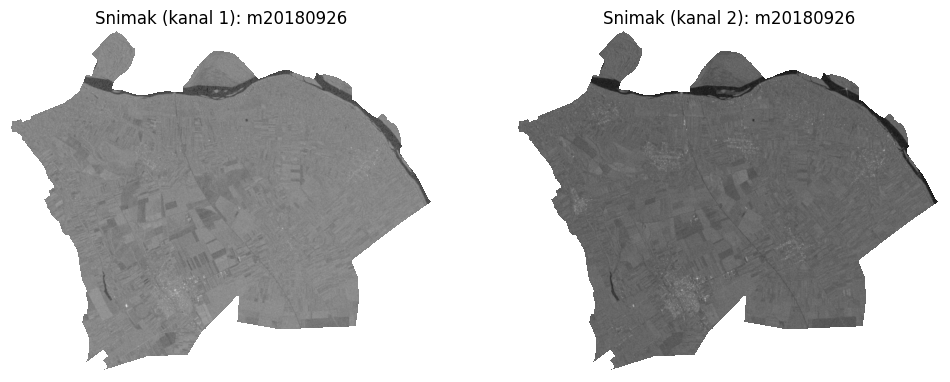

In [ ]:
import os
import rasterio
import matplotlib.pyplot as plt
import numpy as np

# Putanja do fascikle sa snimcima na Google Drive File Stream-u
folder_path = '/content/drive/MyDrive/biosense/Upotreba'

# Lista svih snimaka u fascikli
snimci = os.listdir(folder_path)

# Iterirajte kroz sve snimke i čitajte ih
for snimak in snimci:
    snimak_path = os.path.join(folder_path, snimak)

    # Otvorite snimak sa rasterio
    with rasterio.open(snimak_path) as src:
        # Čitajte snimak za oba kanala
        snimak_data_1 = src.read(1)
        snimak_data_2 = src.read(2)

        # Prikazivanje statistike za oba kanala
        print(f"Snimak: {snimak_naziv}")
        print(f"Datum: {snimak_datum}")

        print("Statistika za prvi kanal:")
        print(f"Minimum: {np.min(snimak_data_1)}")
        print(f"Maksimum: {np.max(snimak_data_1)}")
        print(f"Srednja vrednost: {np.mean(snimak_data_1)}")
        print(f"Standardna devijacija: {np.std(snimak_data_1)}")

        print("Statistika za drugi kanal:")
        print(f"Minimum: {np.min(snimak_data_2)}")
        print(f"Maksimum: {np.max(snimak_data_2)}")
        print(f"Srednja vrednost: {np.mean(snimak_data_2)}")
        print(f"Standardna devijacija: {np.std(snimak_data_2)}")

        # Prikazivanje snimaka za oba kanala
        plt.figure(figsize=(12, 6))
        plt.subplot(1, 2, 1)
        plt.imshow(snimak_data_1, cmap='gray')
        plt.title(f"Snimak (kanal 1): {snimak_naziv}")
        plt.axis('off')

        plt.subplot(1, 2, 2)
        plt.imshow(snimak_data_2, cmap='gray')
        plt.title(f"Snimak (kanal 2): {snimak_naziv}")
        plt.axis('off')

        plt.show()


In [ ]:
import geopandas as gpd
import os
import rasterio
from rasterio.mask import mask
from shapely.geometry import mapping

# Putanja do Shapefile-a
shapefile_path = '/content/drive/MyDrive/biosense/finalshp.shp'  # Zamijenite putanjom sa stvarnom putanjom vašeg Shapefile-a
gdf = gpd.read_file(shapefile_path)

# Putanja do fascikle sa snimcima na Google Drive File Stream-u
folder_path = '/content/drive/MyDrive/biosense/Upotreba'

# Kreiranje fascikle za izlazne snimke (ako ne postoji)
output_folder = '/content/drive/MyDrive/biosense/Iseceni_snimci'
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

# Iterirajte kroz sve snimke i isecite ih prema Shapefile-u
for snimak in os.listdir(folder_path):
    snimak_path = os.path.join(folder_path, snimak)
    with rasterio.open(snimak_path) as src:
        # Izdvojite geometriju iz Shapefile-a
        shapes = gdf['geometry']
        geojson = gdf.to_crs(src.crs).to_json()
        mask_shape = [mapping(shape) for shape in shapes]

        # Isecanje snimka
        out_image, out_transform = mask(src, mask_shape, crop=True)
        out_meta = src.meta.copy()

        # Sačuvajte iseceni snimak
        out_meta.update({"driver": "GTiff",
                         "height": out_image.shape[1],
                         "width": out_image.shape[2],
                         "transform": out_transform})
        output_path = os.path.join(output_folder, snimak)
        with rasterio.open(output_path, "w", **out_meta) as dest:
            dest.write(out_image)


Broj kanala: 2
Statistika za kanal 1:
Minimum: -31.20001983642578
Maksimum: 14.25601577758789
Srednja vrednost: -9.377679824829102
Standardna devijacija: 8.080477714538574


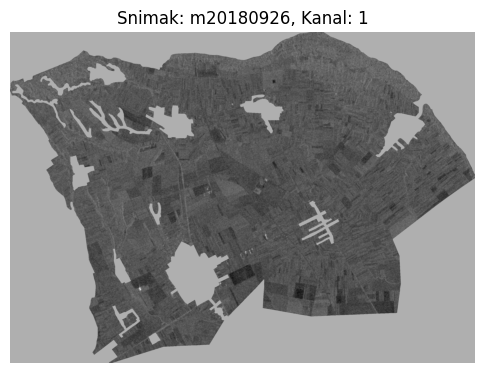

Broj kanala: 2
Statistika za kanal 2:
Minimum: -19.880186080932617
Maksimum: 23.202163696289062
Srednja vrednost: -4.221473693847656
Standardna devijacija: 3.9587080478668213


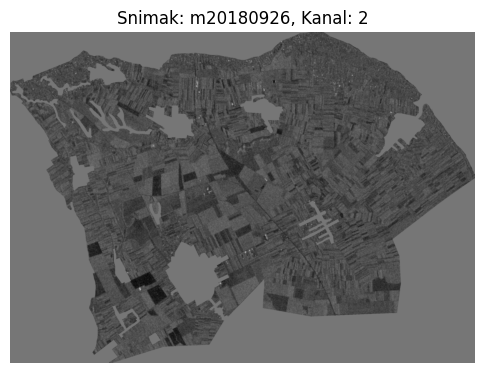

Broj kanala: 2
Statistika za kanal 1:
Minimum: -41.95063018798828
Maksimum: 13.543407440185547
Srednja vrednost: -11.915011405944824
Standardna devijacija: 10.518760681152344


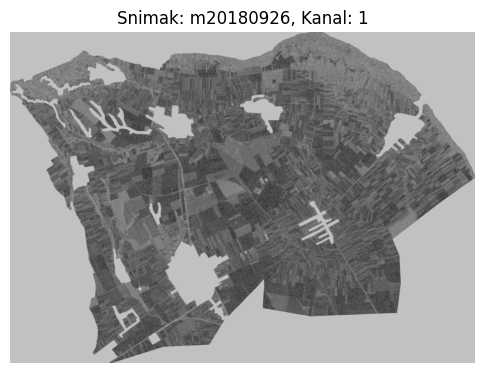

Broj kanala: 2
Statistika za kanal 2:
Minimum: -23.958885192871094
Maksimum: 19.108074188232422
Srednja vrednost: -7.161411762237549
Standardna devijacija: 6.327381134033203


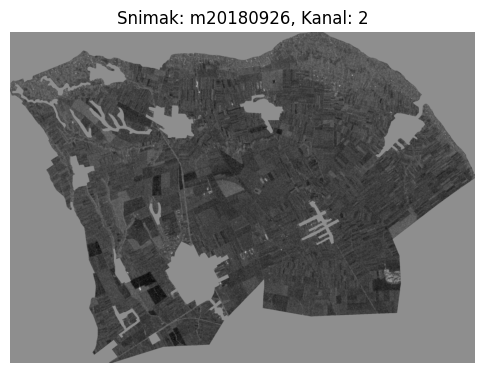

Broj kanala: 2
Statistika za kanal 1:
Minimum: -47.938350677490234
Maksimum: 12.562921524047852
Srednja vrednost: -12.73693561553955
Standardna devijacija: 11.208620071411133


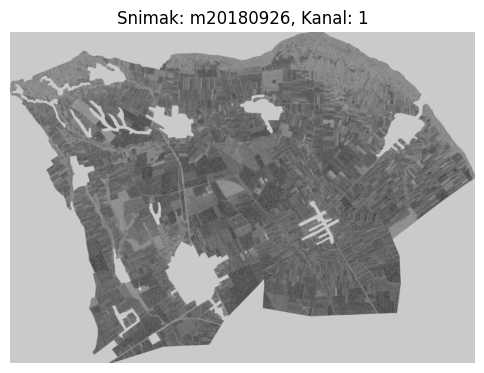

Broj kanala: 2
Statistika za kanal 2:
Minimum: -26.41510772705078
Maksimum: 20.100322723388672
Srednja vrednost: -7.699492931365967
Standardna devijacija: 6.851230144500732


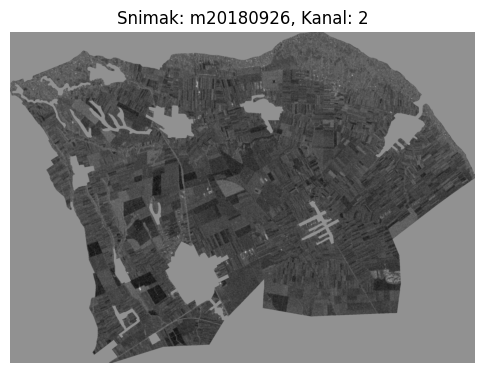

Broj kanala: 2
Statistika za kanal 1:
Minimum: -46.694026947021484
Maksimum: 13.070667266845703
Srednja vrednost: -12.761528968811035
Standardna devijacija: 11.241036415100098


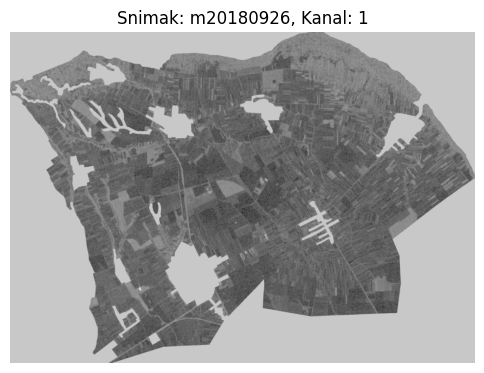

Broj kanala: 2
Statistika za kanal 2:
Minimum: -28.572959899902344
Maksimum: 18.991910934448242
Srednja vrednost: -7.929851531982422
Standardna devijacija: 7.084013938903809


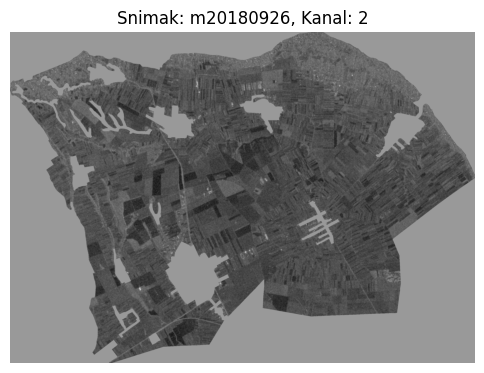

Broj kanala: 2
Statistika za kanal 1:
Minimum: -44.87541961669922
Maksimum: 13.656783103942871
Srednja vrednost: -12.279698371887207
Standardna devijacija: 10.812169075012207


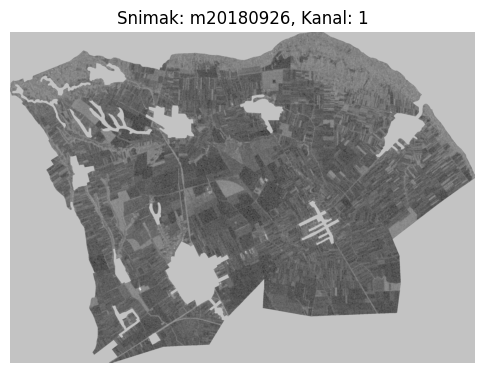

Broj kanala: 2
Statistika za kanal 2:
Minimum: -25.048748016357422
Maksimum: 19.87853240966797
Srednja vrednost: -7.676692962646484
Standardna devijacija: 6.849644660949707


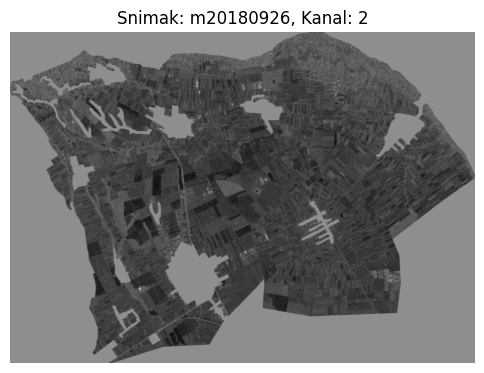

Broj kanala: 2
Statistika za kanal 1:
Minimum: -33.654178619384766
Maksimum: 13.7520751953125
Srednja vrednost: -9.825170516967773
Standardna devijacija: 8.524725914001465


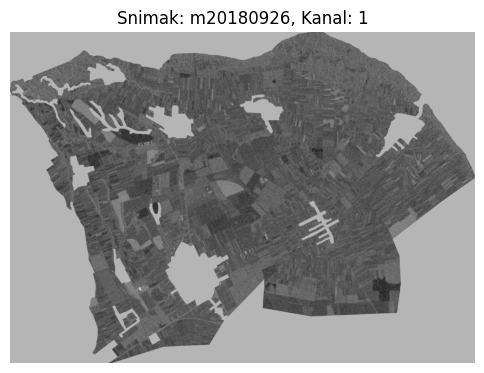

Broj kanala: 2
Statistika za kanal 2:
Minimum: -20.870553970336914
Maksimum: 18.949831008911133
Srednja vrednost: -6.021997451782227
Standardna devijacija: 5.346310138702393


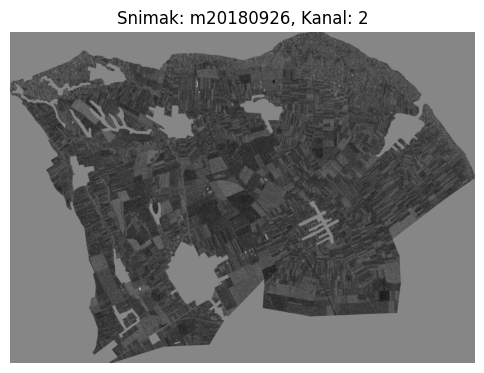

Broj kanala: 2
Statistika za kanal 1:
Minimum: -43.53995895385742
Maksimum: 13.397256851196289
Srednja vrednost: -10.511110305786133
Standardna devijacija: 9.162808418273926


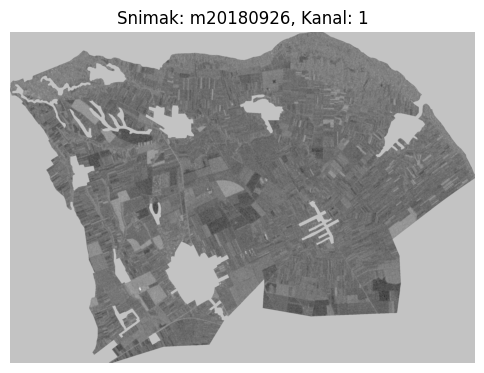

Broj kanala: 2
Statistika za kanal 2:
Minimum: -20.645055770874023
Maksimum: 18.107065200805664
Srednja vrednost: -6.331639766693115
Standardna devijacija: 5.621637344360352


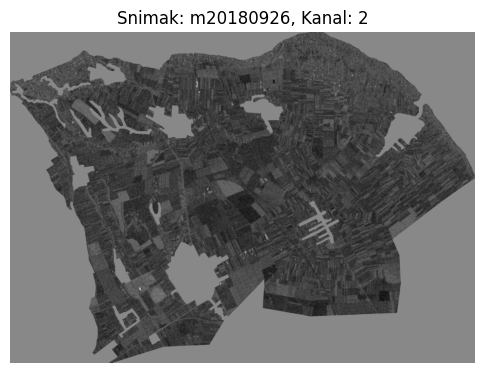

Broj kanala: 2
Statistika za kanal 1:
Minimum: -36.67631530761719
Maksimum: 13.388816833496094
Srednja vrednost: -9.823262214660645
Standardna devijacija: 8.544663429260254


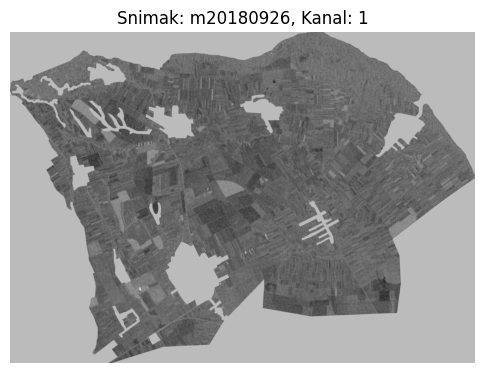

Broj kanala: 2
Statistika za kanal 2:
Minimum: -20.29842758178711
Maksimum: 19.81053924560547
Srednja vrednost: -5.513236999511719
Standardna devijacija: 4.939548492431641


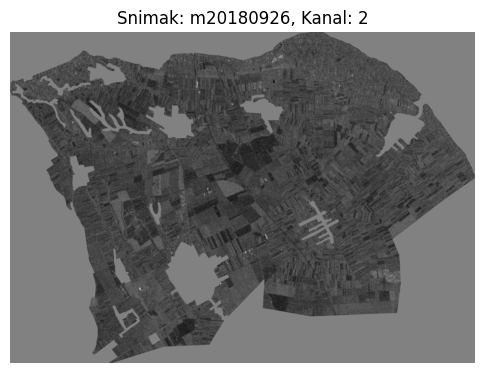

Broj kanala: 2
Statistika za kanal 1:
Minimum: -41.75154113769531
Maksimum: 13.805137634277344
Srednja vrednost: -12.079541206359863
Standardna devijacija: 10.61704158782959


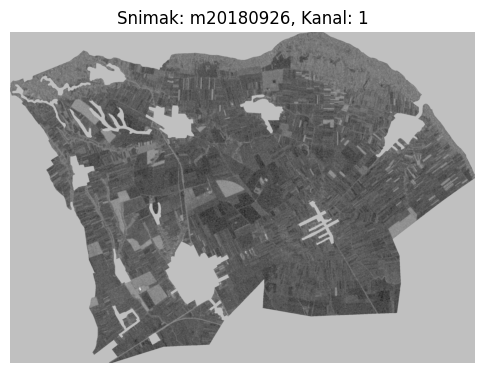

Broj kanala: 2
Statistika za kanal 2:
Minimum: -21.51605987548828
Maksimum: 18.626510620117188
Srednja vrednost: -7.327786922454834
Standardna devijacija: 6.507532596588135


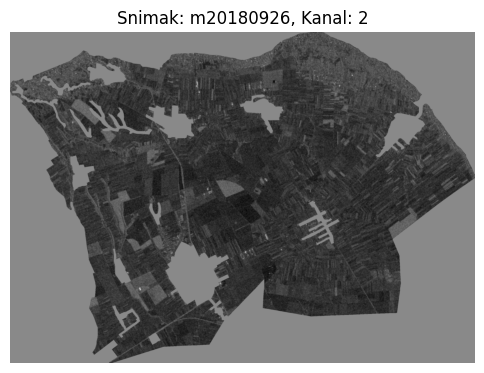

Broj kanala: 2
Statistika za kanal 1:
Minimum: -36.085689544677734
Maksimum: 13.704103469848633
Srednja vrednost: -11.003435134887695
Standardna devijacija: 9.631889343261719


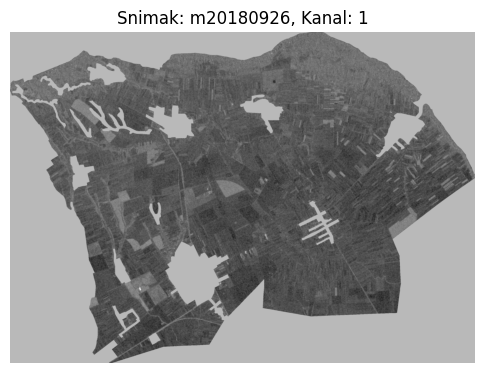

Broj kanala: 2
Statistika za kanal 2:
Minimum: -21.620920181274414
Maksimum: 20.309951782226562
Srednja vrednost: -6.446464538574219
Standardna devijacija: 5.796805381774902


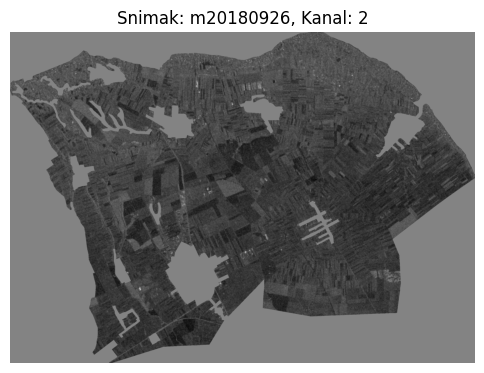

Broj kanala: 2
Statistika za kanal 1:
Minimum: -26.50455093383789
Maksimum: 13.436474800109863
Srednja vrednost: -8.27928352355957
Standardna devijacija: 7.086629390716553


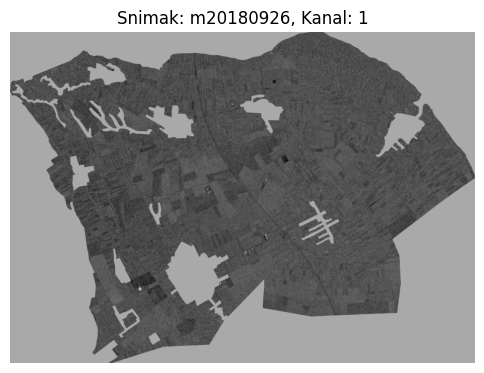

Broj kanala: 2
Statistika za kanal 2:
Minimum: -18.385265350341797
Maksimum: 23.275253295898438
Srednja vrednost: -4.414853096008301
Standardna devijacija: 3.9571380615234375


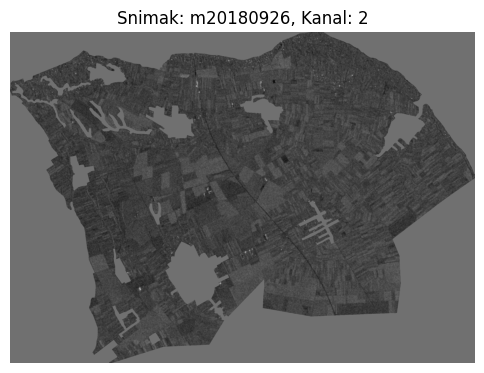

Broj kanala: 2
Statistika za kanal 1:
Minimum: -27.318798065185547
Maksimum: 13.069010734558105
Srednja vrednost: -8.336730003356934
Standardna devijacija: 7.1410136222839355


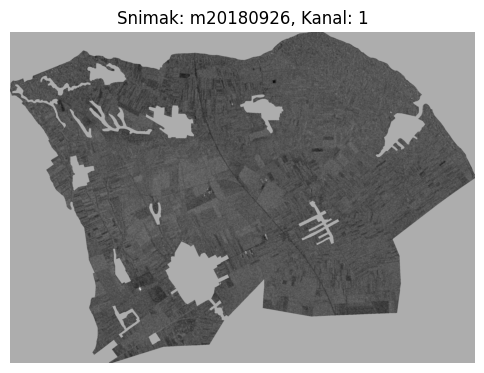

Broj kanala: 2
Statistika za kanal 2:
Minimum: -18.29253387451172
Maksimum: 19.2454833984375
Srednja vrednost: -4.359679222106934
Standardna devijacija: 3.9274771213531494


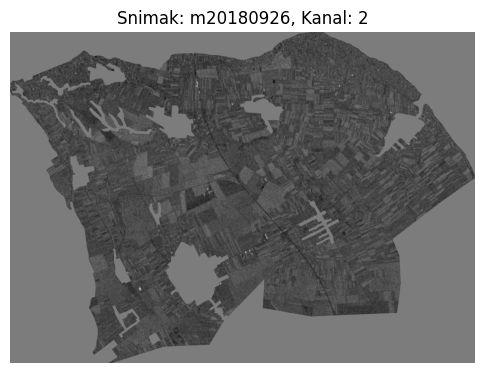

Broj kanala: 2
Statistika za kanal 1:
Minimum: -31.887977600097656
Maksimum: 13.885937690734863
Srednja vrednost: -8.558860778808594
Standardna devijacija: 7.416046142578125


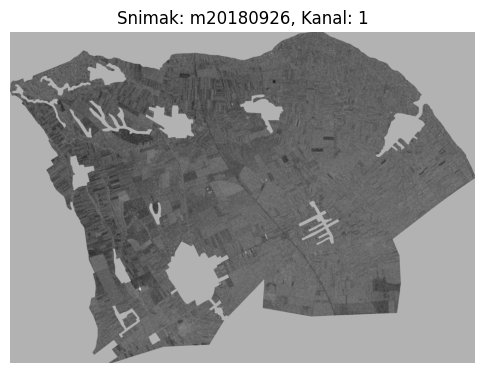

Broj kanala: 2
Statistika za kanal 2:
Minimum: -18.07697296142578
Maksimum: 19.521007537841797
Srednja vrednost: -4.815608978271484
Standardna devijacija: 4.356435775756836


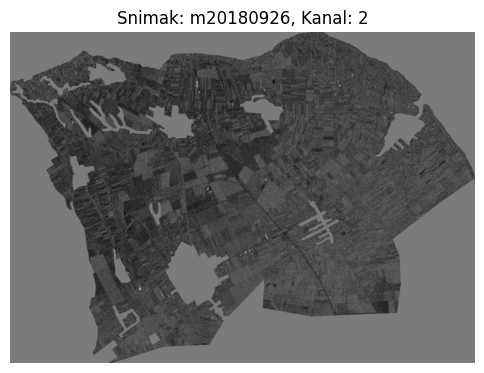

Broj kanala: 2
Statistika za kanal 1:
Minimum: -30.151870727539062
Maksimum: 13.448711395263672
Srednja vrednost: -9.484990119934082
Standardna devijacija: 8.176677703857422


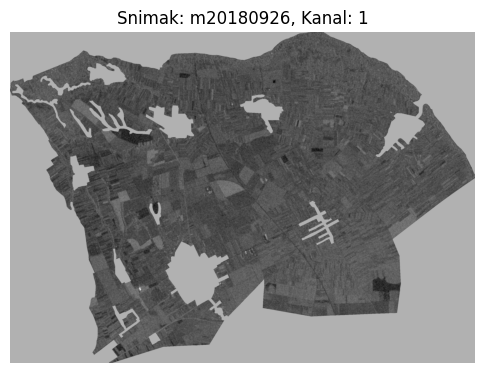

Broj kanala: 2
Statistika za kanal 2:
Minimum: -21.039413452148438
Maksimum: 18.601764678955078
Srednja vrednost: -5.553822040557861
Standardna devijacija: 4.952229022979736


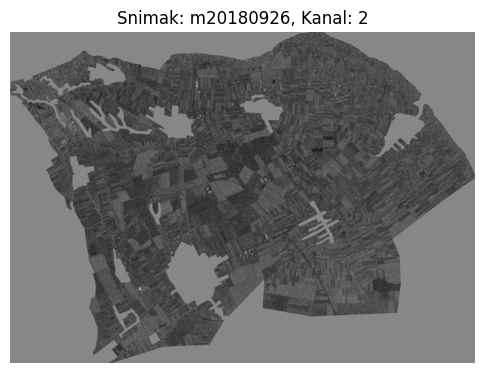

Broj kanala: 2
Statistika za kanal 1:
Minimum: -36.72126388549805
Maksimum: 13.377058029174805
Srednja vrednost: -9.644577026367188
Standardna devijacija: 8.356143951416016


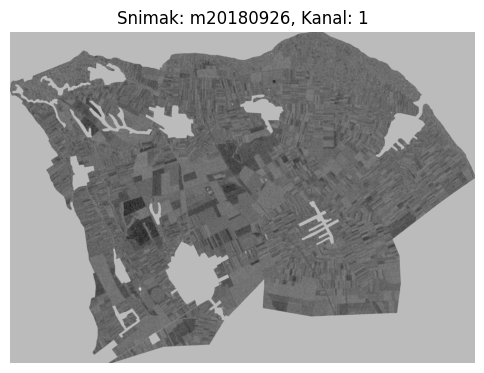

Broj kanala: 2
Statistika za kanal 2:
Minimum: -22.063995361328125
Maksimum: 18.220598220825195
Srednja vrednost: -5.469930648803711
Standardna devijacija: 4.9087395668029785


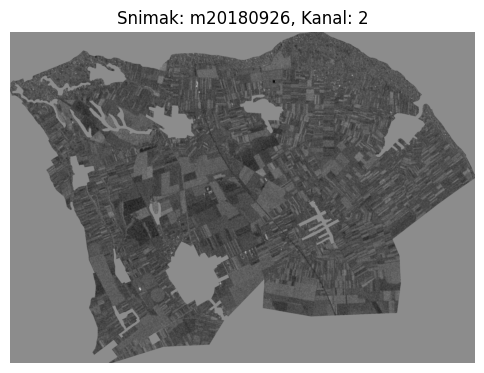

Broj kanala: 2
Statistika za kanal 1:
Minimum: -35.778839111328125
Maksimum: 13.367505073547363
Srednja vrednost: -9.167813301086426
Standardna devijacija: 7.959669589996338


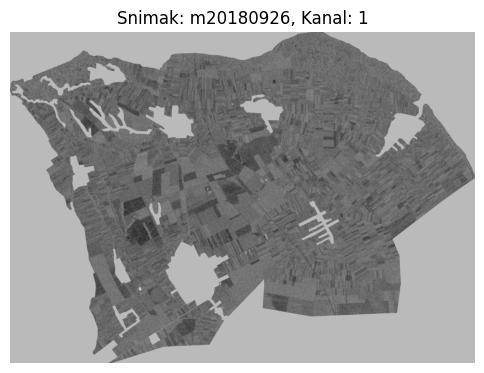

Broj kanala: 2
Statistika za kanal 2:
Minimum: -21.74609375
Maksimum: 19.364356994628906
Srednja vrednost: -5.211341857910156
Standardna devijacija: 4.676182746887207


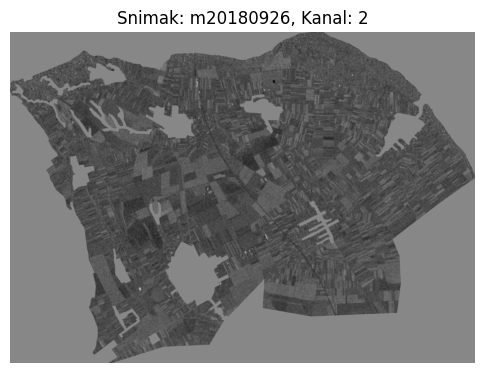

Broj kanala: 2
Statistika za kanal 1:
Minimum: -32.835418701171875
Maksimum: 13.233007431030273
Srednja vrednost: -8.991067886352539
Standardna devijacija: 7.73502254486084


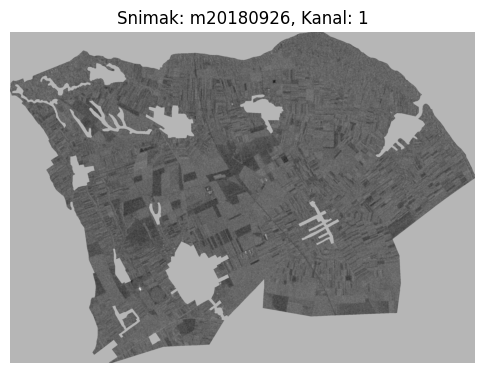

Broj kanala: 2
Statistika za kanal 2:
Minimum: -20.303604125976562
Maksimum: 19.44782829284668
Srednja vrednost: -4.88909912109375
Standardna devijacija: 4.341969013214111


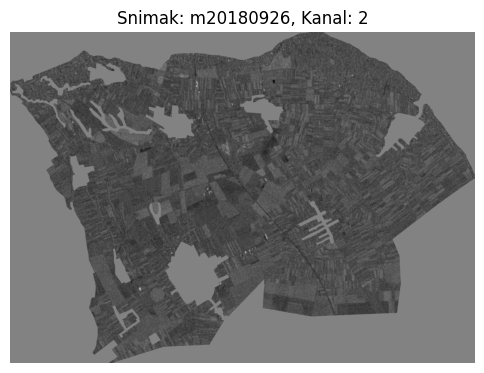

Broj kanala: 2
Statistika za kanal 1:
Minimum: -33.4163818359375
Maksimum: 13.48342514038086
Srednja vrednost: -9.319241523742676
Standardna devijacija: 8.070366859436035


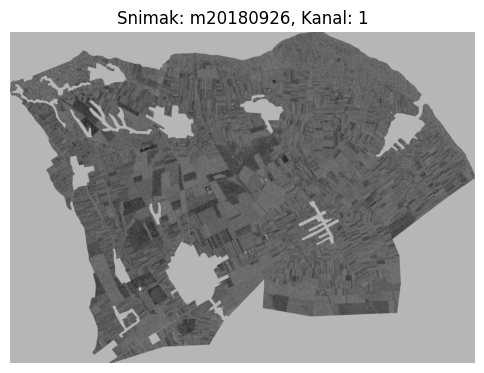

Broj kanala: 2
Statistika za kanal 2:
Minimum: -20.135478973388672
Maksimum: 19.079389572143555
Srednja vrednost: -5.3198394775390625
Standardna devijacija: 4.709963798522949


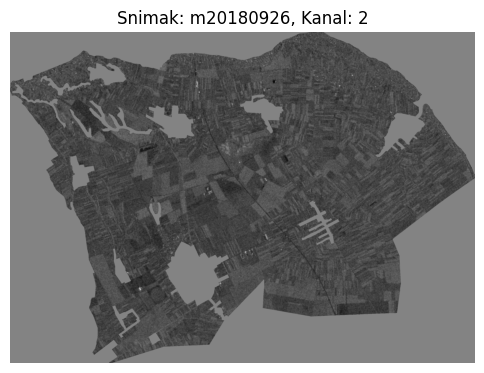

Broj kanala: 2
Statistika za kanal 1:
Minimum: -30.363311767578125
Maksimum: 15.623250961303711
Srednja vrednost: -8.62854290008545
Standardna devijacija: 7.461791038513184


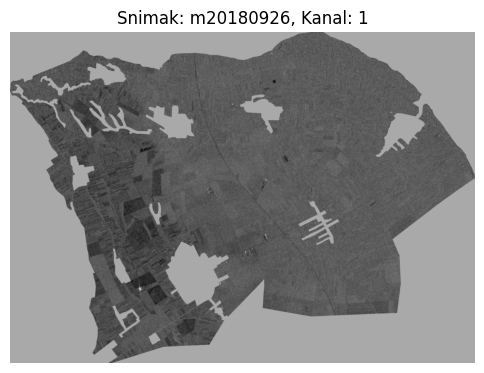

Broj kanala: 2
Statistika za kanal 2:
Minimum: -19.532930374145508
Maksimum: 25.88392448425293
Srednja vrednost: -4.585789680480957
Standardna devijacija: 4.192117214202881


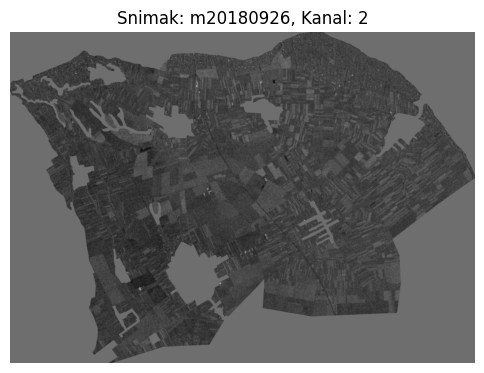

Broj kanala: 2
Statistika za kanal 1:
Minimum: -40.773338317871094
Maksimum: 13.979004859924316
Srednja vrednost: -10.064519882202148
Standardna devijacija: 8.822309494018555


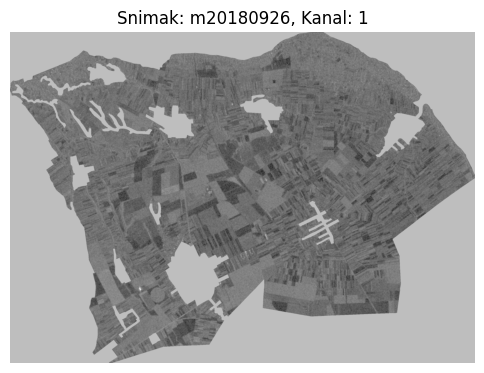

Broj kanala: 2
Statistika za kanal 2:
Minimum: -23.38296127319336
Maksimum: 18.722700119018555
Srednja vrednost: -6.103780269622803
Standardna devijacija: 5.4192352294921875


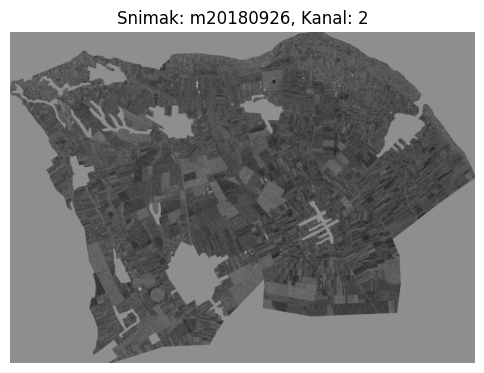

Broj kanala: 2
Statistika za kanal 1:
Minimum: -35.21200942993164
Maksimum: 13.634170532226562
Srednja vrednost: -9.191018104553223
Standardna devijacija: 8.010749816894531


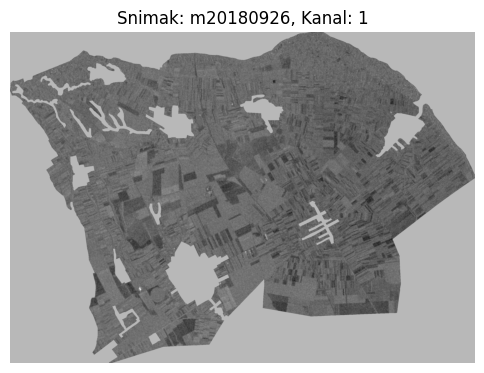

Broj kanala: 2
Statistika za kanal 2:
Minimum: -23.013418197631836
Maksimum: 19.25764274597168
Srednja vrednost: -5.182534217834473
Standardna devijacija: 4.658374786376953


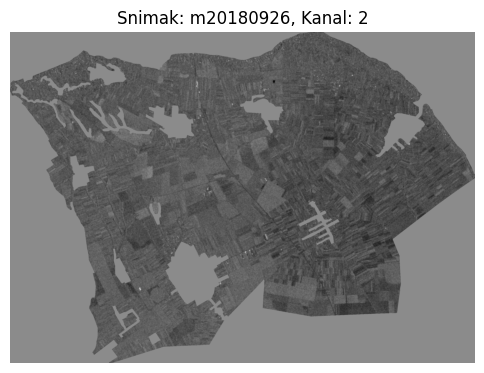

Broj kanala: 2
Statistika za kanal 1:
Minimum: -37.307132720947266
Maksimum: 13.815940856933594
Srednja vrednost: -9.503011703491211
Standardna devijacija: 8.265254974365234


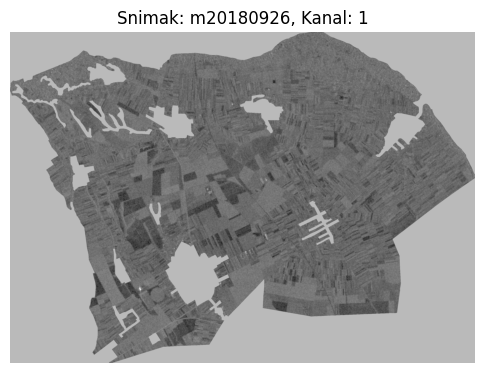

Broj kanala: 2
Statistika za kanal 2:
Minimum: -20.126998901367188
Maksimum: 18.834636688232422
Srednja vrednost: -5.643317699432373
Standardna devijacija: 5.032469749450684


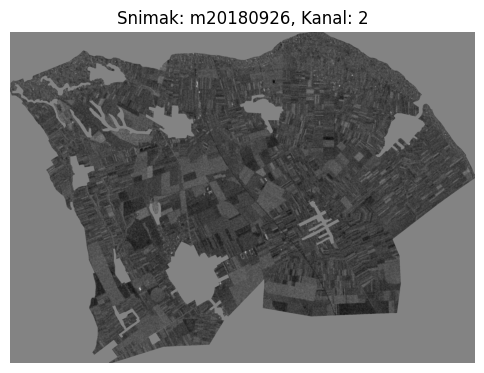

Broj kanala: 2
Statistika za kanal 1:
Minimum: -32.5283203125
Maksimum: 11.616331100463867
Srednja vrednost: -9.063852310180664
Standardna devijacija: 7.8545732498168945


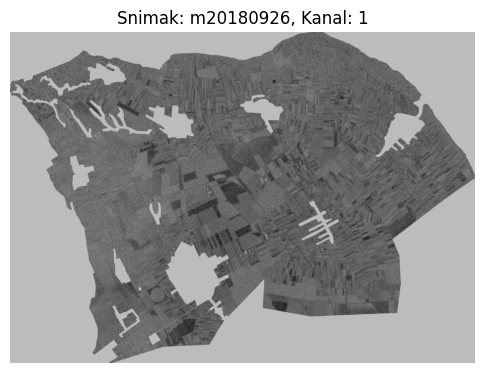

Broj kanala: 2
Statistika za kanal 2:
Minimum: -20.12873077392578
Maksimum: 18.061283111572266
Srednja vrednost: -5.028774261474609
Standardna devijacija: 4.538718223571777


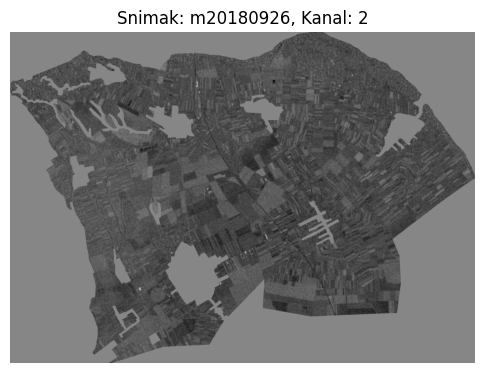

Broj kanala: 2
Statistika za kanal 1:
Minimum: -31.932453155517578
Maksimum: 13.024702072143555
Srednja vrednost: -8.774025917053223
Standardna devijacija: 7.608234405517578


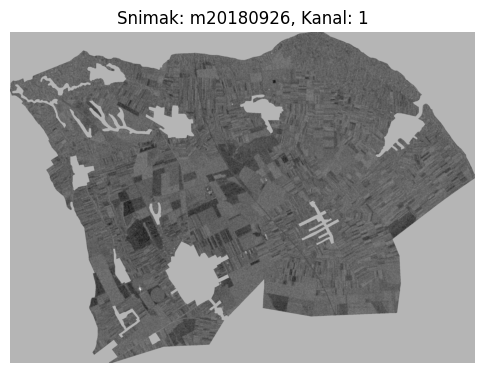

Broj kanala: 2
Statistika za kanal 2:
Minimum: -20.05599021911621
Maksimum: 19.61970329284668
Srednja vrednost: -4.9397149085998535
Standardna devijacija: 4.438393592834473


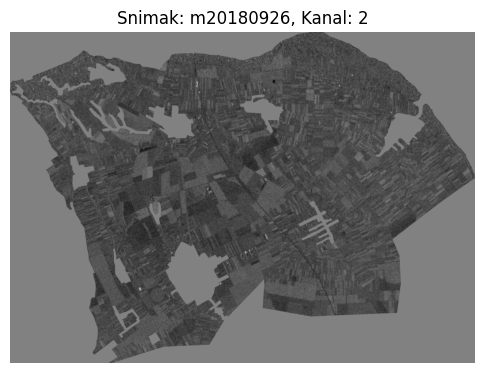

Broj kanala: 2
Statistika za kanal 1:
Minimum: -43.0661735534668
Maksimum: 12.599936485290527
Srednja vrednost: -11.199110984802246
Standardna devijacija: 9.800477981567383


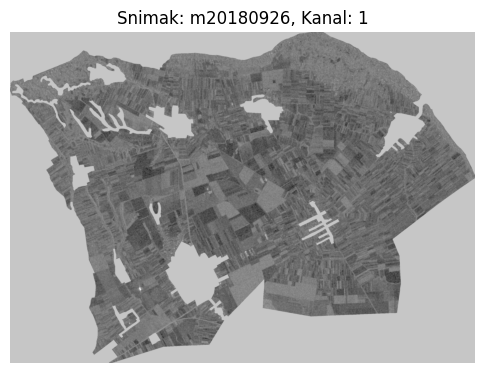

Broj kanala: 2
Statistika za kanal 2:
Minimum: -23.042638778686523
Maksimum: 17.251632690429688
Srednja vrednost: -6.66849946975708
Standardna devijacija: 5.879845142364502


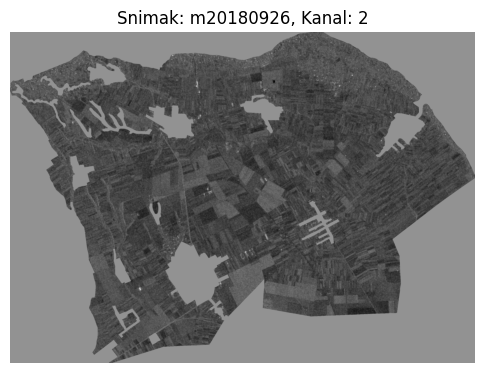

Broj kanala: 2
Statistika za kanal 1:
Minimum: -43.6956787109375
Maksimum: 13.454410552978516
Srednja vrednost: -10.668939590454102
Standardna devijacija: 9.373351097106934


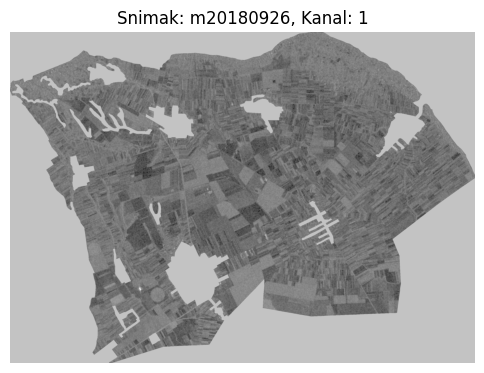

Broj kanala: 2
Statistika za kanal 2:
Minimum: -23.809261322021484
Maksimum: 18.193742752075195
Srednja vrednost: -6.354289531707764
Standardna devijacija: 5.6112446784973145


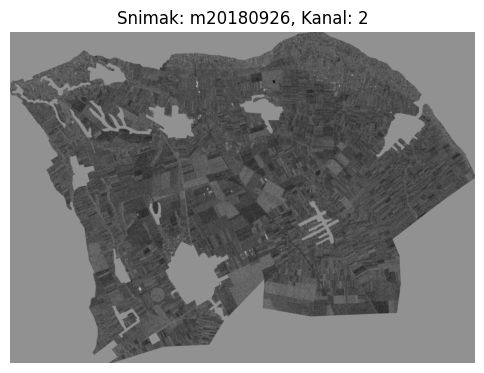

Broj kanala: 2
Statistika za kanal 1:
Minimum: -40.92567825317383
Maksimum: 12.87540054321289
Srednja vrednost: -9.996098518371582
Standardna devijacija: 8.809645652770996


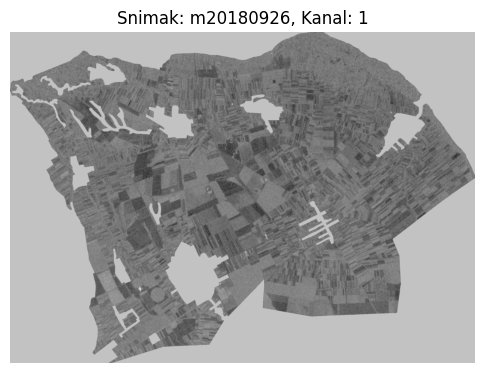

Broj kanala: 2
Statistika za kanal 2:
Minimum: -24.047870635986328
Maksimum: 19.195043563842773
Srednja vrednost: -5.719304084777832
Standardna devijacija: 5.112744331359863


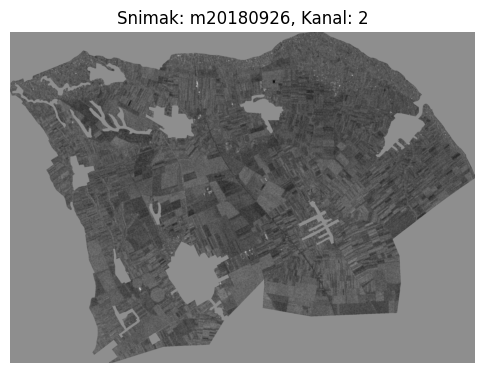

Broj kanala: 2
Statistika za kanal 1:
Minimum: -42.78364562988281
Maksimum: 13.924139022827148
Srednja vrednost: -9.962828636169434
Standardna devijacija: 8.784936904907227


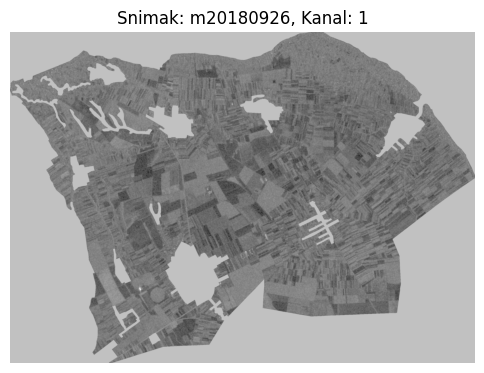

Broj kanala: 2
Statistika za kanal 2:
Minimum: -22.433307647705078
Maksimum: 18.529296875
Srednja vrednost: -5.792006015777588
Standardna devijacija: 5.162571907043457


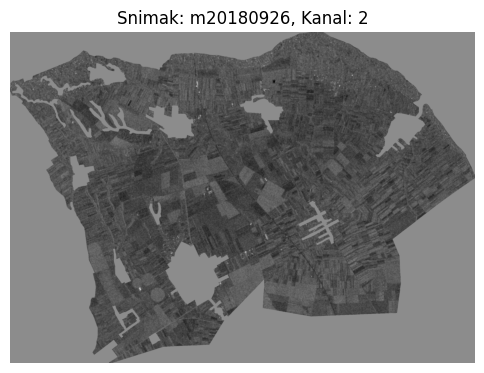

Broj kanala: 2
Statistika za kanal 1:
Minimum: -34.75452423095703
Maksimum: 12.56186294555664
Srednja vrednost: -8.66244888305664
Standardna devijacija: 7.447115421295166


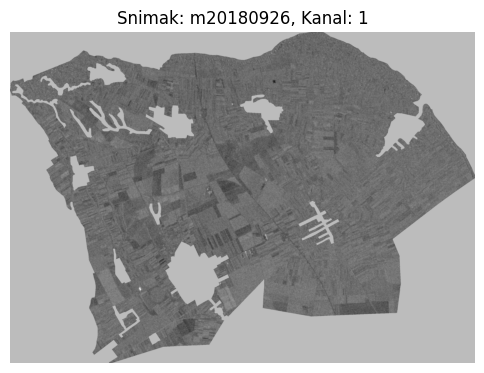

Broj kanala: 2
Statistika za kanal 2:
Minimum: -22.696735382080078
Maksimum: 18.376432418823242
Srednja vrednost: -4.717090129852295
Standardna devijacija: 4.172677993774414


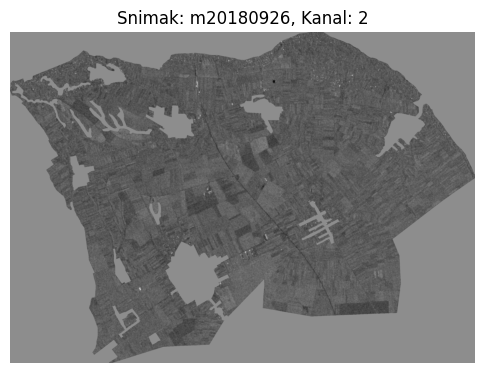

Broj kanala: 2
Statistika za kanal 1:
Minimum: -45.883087158203125
Maksimum: 12.202201843261719
Srednja vrednost: -11.266758918762207
Standardna devijacija: 9.838162422180176


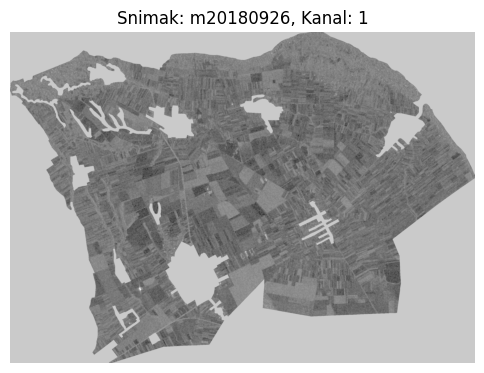

Broj kanala: 2
Statistika za kanal 2:
Minimum: -24.4943904876709
Maksimum: 17.475296020507812
Srednja vrednost: -6.844393253326416
Standardna devijacija: 5.999390602111816


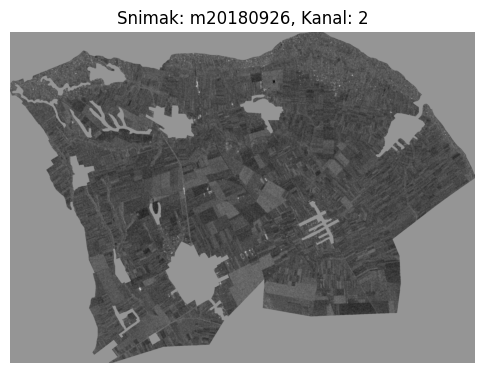

In [ ]:
import os
import rasterio
import matplotlib.pyplot as plt
import numpy as np

# Putanja do fascikle sa snimcima na Google Drive File Stream-u
folder_path = '/content/drive/MyDrive/biosense/Iseceni_snimci'

# Lista svih snimaka u fascikli
snimci = os.listdir(folder_path)

# Iterirajte kroz sve snimke i čitajte ih
for snimak in snimci:
    snimak_path = os.path.join(folder_path, snimak)

    # Otvorite snimak sa rasterio
    with rasterio.open(snimak_path) as src:
        # Broj kanala na snimku
        broj_kanala = src.count

        # Prikazivanje statistike za svaki kanal
        for kanal in range(broj_kanala):
            kanal_data = src.read(kanal + 1)  # Kanali se broje od 1
            print(f"Broj kanala: {broj_kanala}")
            print(f"Statistika za kanal {kanal + 1}:")
            print(f"Minimum: {np.min(kanal_data)}")
            print(f"Maksimum: {np.max(kanal_data)}")
            print(f"Srednja vrednost: {np.mean(kanal_data)}")
            print(f"Standardna devijacija: {np.std(kanal_data)}")

            # Prikazivanje isecenog snimka za taj kanal
            plt.figure(figsize=(6, 6))
            plt.imshow(kanal_data, cmap='gray')
            plt.title(f"Snimak: {snimak_naziv}, Kanal: {kanal + 1}")
            plt.axis('off')
            plt.show()




In [ ]:
import os
import rasterio
import pandas as pd

# Putanja do foldera sa isecenim snimcima na Google Drive File Stream-u
folder_path = '/content/drive/MyDrive/biosense/Iseceni_snimci'

# Putanja do foldera gde ćemo sačuvati CSV fajlove
output_folder = '/content/drive/MyDrive/biosense/CSV_snimci'
if not os.path.exists(output_folder):
    os.makedirs(output_folder)
# Lista svih snimaka u folderu
snimci = os.listdir(folder_path)

# Iterirajte kroz sve snimke
for snimak in snimci:
    snimak_path = os.path.join(folder_path, snimak)

    # Otvaranje snimka sa rasterio
    with rasterio.open(snimak_path) as src:
        # Čitanje svih kanala snimka
        snimak_data = src.read()

        # Promena dimenzija za olakšavanje obrade
        snimak_data = snimak_data.transpose(1, 2, 0)

        # Kreiranje DataFrame-a sa posebnim kolonama za svaki kanal
        snimak_df = pd.DataFrame(snimak_data.reshape(-1, snimak_data.shape[2]), columns=[f"Kanal_{i+1}" for i in range(snimak_data.shape[2])])

        # Dodavanje naziva snimka kao posebne kolone
        #snimak_df['Naziv_Snimka'] = snimak

        # Snimanje DataFrame-a u CSV fajl
        csv_file_path = os.path.join(output_folder, f"{os.path.splitext(snimak)[0]}.csv")
        snimak_df.to_csv(csv_file_path, index=False)


In [ ]:
import rasterio
import pandas as pd

# Otvorite TIFF sliku pomoću Rasterio
with rasterio.open("/content/drive/MyDrive/biosense/Iseceni_snimci/m20180405.tif") as dataset:
    # Dobijte metapodatke o slici
    width = dataset.width
    height = dataset.height

    # Inicijalizujte prazan DataFrame
    data = {'x': [], 'y': []}
    coordinates = []

    # Iterirajte kroz svaki piksel slike i dodajte x i y koordinate u listu
    for y in range(height):
        for x in range(width):
            lon, lat = dataset.xy(y, x)  # Konvertujte pikselne koordinate u geografske koordinate
            coordinates.append({'x': lon, 'y': lat})

    # Kreirajte DataFrame iz liste koordinata
    df = pd.DataFrame(coordinates)

# Sačuvajte DataFrame u CSV fajl
df.to_csv('pixel_coordinates.csv', index=False)


In [ ]:
df.head


<bound method NDFrame.head of                 x          y
0        416745.0  5003255.0
1        416755.0  5003255.0
2        416765.0  5003255.0
3        416775.0  5003255.0
4        416785.0  5003255.0
...           ...        ...
5479443  444425.0  4983505.0
5479444  444435.0  4983505.0
5479445  444445.0  4983505.0
5479446  444455.0  4983505.0
5479447  444465.0  4983505.0

[5479448 rows x 2 columns]>

In [ ]:
import os
import rasterio
import pandas as pd

# Putanja do fascikle sa isecenim snimcima na Google Drive File Stream-u
output_folder = '/content/drive/MyDrive/biosense/Iseceni_snimci'

# Putanja do fascikle na Google Drive gde ćete sačuvati CSV fajlove
csv_output_folder = '/content/drive/MyDrive/biosense/CSV_snimci'

# Kreirajte CSV fasciklu ako ne postoji
if not os.path.exists(csv_output_folder):
    os.makedirs(csv_output_folder)

# Iterirajte kroz sve isecene snimke
for iseceni_snimak in os.listdir(output_folder):
    iseceni_snimak_path = os.path.join(output_folder, iseceni_snimak)

    # Otvorite iseceni snimak
    with rasterio.open(iseceni_snimak_path) as src:
        # Čitanje vrednosti piksela kao niz
        kanal_1 = src.read(1).flatten()
        kanal_2 = src.read(2).flatten()

        # Kreirajte DataFrame sa vrednostima kanala
        df = pd.DataFrame({"kanal 1": kanal_1, "kanal 2": kanal_2})

        # Izdvojite naziv snimka bez ekstenzije
        snimak_naziv = os.path.splitext(iseceni_snimak)[0]

        # Sačuvajte DataFrame kao CSV fajl
        csv_path = os.path.join(csv_output_folder, f"{snimak_naziv}.csv")
        df.to_csv(csv_path, index=False)



In [ ]:
# Putanja do fascikle sa CSV fajlovima
csv_output_folder = '/content/drive/MyDrive/biosense/CSV_snimci'

# Lista svih CSV fajlova u fascikli
csv_files = [f for f in os.listdir(csv_output_folder) if f.endswith(".csv")]

# Prikaz prvih nekoliko redova svakog CSV fajla
for csv_file in csv_files:
    csv_path = os.path.join(csv_output_folder, csv_file)
    df = pd.read_csv(csv_path)

    # Prikaz prvih nekoliko redova DataFrame-a
    print(f"Prvih nekoliko redova iz CSV fajla '{csv_file}':")
    print(df.head())
    print("\n")


Prvih nekoliko redova iz CSV fajla 'm20180405.csv':
   kanal 1  kanal 2
0      0.0      0.0
1      0.0      0.0
2      0.0      0.0
3      0.0      0.0
4      0.0      0.0


Prvih nekoliko redova iz CSV fajla 'm20180417.csv':
   kanal 1  kanal 2
0      0.0      0.0
1      0.0      0.0
2      0.0      0.0
3      0.0      0.0
4      0.0      0.0


Prvih nekoliko redova iz CSV fajla 'm20180429.csv':
   kanal 1  kanal 2
0      0.0      0.0
1      0.0      0.0
2      0.0      0.0
3      0.0      0.0
4      0.0      0.0


Prvih nekoliko redova iz CSV fajla 'm20180529.csv':
   kanal 1  kanal 2
0      0.0      0.0
1      0.0      0.0
2      0.0      0.0
3      0.0      0.0
4      0.0      0.0


Prvih nekoliko redova iz CSV fajla 'm20180517.csv':
   kanal 1  kanal 2
0      0.0      0.0
1      0.0      0.0
2      0.0      0.0
3      0.0      0.0
4      0.0      0.0


Prvih nekoliko redova iz CSV fajla 'm20180505.csv':
   kanal 1  kanal 2
0      0.0      0.0
1      0.0      0.0
2      0.0      0.

In [ ]:
import os
import pandas as pd
import numpy as np
from google.colab import drive


# Putanja do foldera sa isječenim snimcima na Google Driveu
csv_folder_path = '/content/drive/MyDrive/biosense/CSV_snimci'

# Provjerite da li postoji folder sa CSV datotekama
if not os.path.exists(csv_folder_path):
    print("Folder sa CSV datotekama ne postoji.")
else:
    # Inicijalizirajte brojač za piksele s vrijednostima 0
    zero_pixel_count = 0

    # Iteracija kroz sve CSV datoteke u folderu
    for filename in os.listdir(csv_folder_path):
        if filename.endswith('.csv'):
            csv_filepath = os.path.join(csv_folder_path, filename)

            # Otvorite CSV datoteku koristeći pandas
            df = pd.read_csv(csv_filepath)

            # Prikaz prvih nekoliko redova tablice
            print(f"Glava tablice za datoteku '{filename}':")
            print(df.head())

            # Izračunajte statistiku za svaki kanal
            stats = df.describe()

            # Ispišite statistiku
            print(f"Statistika za datoteku '{filename}':")
            print(stats)

            # Izbroj broj piksela sa vrijednostima 0
            zero_pixel_count += (df == 0).sum().sum()

    # Ispišite ukupan broj piksela sa vrijednostima 0
    print(f"Ukupan broj piksela sa vrijednostima 0: {zero_pixel_count}")


Glava tablice za datoteku 'm20180405.csv':
   kanal 1  kanal 2
0      0.0      0.0
1      0.0      0.0
2      0.0      0.0
3      0.0      0.0
4      0.0      0.0
Statistika za datoteku 'm20180405.csv':
            kanal 1       kanal 2
count  5.479448e+06  5.479448e+06
mean  -9.377677e+00 -4.221475e+00
std    8.080477e+00  3.958709e+00
min   -3.120002e+01 -1.988019e+01
25%   -1.632383e+01 -7.416459e+00
50%   -1.392879e+01 -4.978011e+00
75%    0.000000e+00  0.000000e+00
max    1.425602e+01  2.320216e+01
Glava tablice za datoteku 'm20180417.csv':
   kanal 1  kanal 2
0      0.0      0.0
1      0.0      0.0
2      0.0      0.0
3      0.0      0.0
4      0.0      0.0
Statistika za datoteku 'm20180417.csv':
            kanal 1       kanal 2
count  5.479448e+06  5.479448e+06
mean  -1.273694e+01 -7.699488e+00
std    1.120862e+01  6.851230e+00
min   -4.793835e+01 -2.641511e+01
25%   -2.303209e+01 -1.374183e+01
50%   -1.655627e+01 -1.012558e+01
75%    0.000000e+00  0.000000e+00
max    1.256292e

In [ ]:
# Putanje do CSV fajlova
csv_path1 = '/content/drive/MyDrive/biosense/CSV_snimci/m20180926.csv'
csv_path2 = '/content/drive/MyDrive/biosense/pixel_coordinates.csv'

# Učitavanje CSV fajlova u DataFrame
df1 = pd.read_csv(csv_path1)
df2 = pd.read_csv(csv_path2)

import pandas as pd

# Putanje do CSV fajlova
csv_path1 = '/content/drive/MyDrive/biosense/CSV_snimci/m20180926.csv'
csv_path2 = '/content/drive/MyDrive/biosense/pixel_coordinates.csv'

# Učitavanje CSV fajlova u DataFrame
df1 = pd.read_csv(csv_path1)
df2 = pd.read_csv(csv_path2)

# Dodavanje nove kolone "Piksel" u oba DataFrame-a
df1['Piksel'] = range(1, len(df1) + 1)
df2['Piksel'] = range(1, len(df2) + 1)

# Prikaz prvih nekoliko redova za svaki DataFrame nakon dodavanja kolone "Piksel"
print("Prvih nekoliko redova za df1 sa dodatom kolonom 'Piksel':")
print(df1.head())

print("Prvih nekoliko redova za df2 sa dodatom kolonom 'Piksel':")
print(df2.head())

print("Nazivi kolona u df1:")
print(df1.columns)

print("Nazivi kolona u df2:")
print(df2.columns)


Prvih nekoliko redova za df1 sa dodatom kolonom 'Piksel':
   kanal 1  kanal 2  Piksel
0      0.0      0.0       1
1      0.0      0.0       2
2      0.0      0.0       3
3      0.0      0.0       4
4      0.0      0.0       5
Prvih nekoliko redova za df2 sa dodatom kolonom 'Piksel':
          x          y  Piksel
0  416745.0  5003255.0       1
1  416755.0  5003255.0       2
2  416765.0  5003255.0       3
3  416775.0  5003255.0       4
4  416785.0  5003255.0       5
Nazivi kolona u df1:
Index(['kanal 1', 'kanal 2', 'Piksel'], dtype='object')
Nazivi kolona u df2:
Index(['x', 'y', 'Piksel'], dtype='object')


In [ ]:
import os
import pandas as pd

# Putanja do fascikle sa CSV fajlovima
csv_folder = '/content/drive/MyDrive/biosense/CSV_snimci'

# Prikupite sve CSV fajlove u fascikli
csv_files = [f for f in os.listdir(csv_folder) if f.endswith(".csv")]

# Iterirajte kroz sve CSV fajlove u fascikli
for csv_file in csv_files:
    csv_path = os.path.join(csv_folder, csv_file)

    # Učitajte CSV fajl u DataFrame
    df = pd.read_csv(csv_path)

    # Dodajte kolonu "Piksel" kao brojač vrednosti
    df['Piksel'] = range(1, len(df) + 1)

    # Sačuvajte DataFrame u CSV fajl (zamenjujući postojeći)
    df.to_csv(csv_path, index=False)


In [ ]:
import os
import pandas as pd

# Putanja do fascikle sa CSV fajlovima
csv_folder = '/content/drive/MyDrive/biosense/CSV_snimci'

# Prikupite sve CSV fajlove u fascikli
csv_files = [f for f in os.listdir(csv_folder) if f.endswith(".csv")]

# Iterirajte kroz sve CSV fajlove i prikažite prvih nekoliko redova
for csv_file in csv_files:
    csv_path = os.path.join(csv_folder, csv_file)

    # Učitajte CSV fajl u DataFrame
    df = pd.read_csv(csv_path)

    # Prikaz prvih nekoliko redova DataFrame-a
    print(f"Prvih nekoliko redova za '{csv_file}':")
    print(df.head())
    print("\n")


Prvih nekoliko redova za 'm20180405.csv':
   kanal 1  kanal 2  Piksel
0      0.0      0.0       1
1      0.0      0.0       2
2      0.0      0.0       3
3      0.0      0.0       4
4      0.0      0.0       5


Prvih nekoliko redova za 'm20180417.csv':
   kanal 1  kanal 2  Piksel
0      0.0      0.0       1
1      0.0      0.0       2
2      0.0      0.0       3
3      0.0      0.0       4
4      0.0      0.0       5


Prvih nekoliko redova za 'm20180429.csv':
   kanal 1  kanal 2  Piksel
0      0.0      0.0       1
1      0.0      0.0       2
2      0.0      0.0       3
3      0.0      0.0       4
4      0.0      0.0       5


Prvih nekoliko redova za 'm20180529.csv':
   kanal 1  kanal 2  Piksel
0      0.0      0.0       1
1      0.0      0.0       2
2      0.0      0.0       3
3      0.0      0.0       4
4      0.0      0.0       5


Prvih nekoliko redova za 'm20180517.csv':
   kanal 1  kanal 2  Piksel
0      0.0      0.0       1
1      0.0      0.0       2
2      0.0      0.0       

In [ ]:
import pandas as pd

# Putanja do CSV fajla "pixel_coordinates.csv"
csv_path = '/content/drive/MyDrive/biosense/pixel_coordinates.csv'

# Učitavanje CSV fajla u DataFrame
df = pd.read_csv(csv_path)

# Prikaz prvih nekoliko redova DataFrame-a
print("Prvih nekoliko redova za 'pixel_coordinates.csv':")
print(df.head())


Prvih nekoliko redova za 'pixel_coordinates.csv':
          x          y  Piksel
0  416745.0  5003255.0       1
1  416755.0  5003255.0       2
2  416765.0  5003255.0       3
3  416775.0  5003255.0       4
4  416785.0  5003255.0       5


In [ ]:
import pandas as pd

# Putanja do CSV fajla "pixel_coordinates.csv"
csv_path = '/content/drive/MyDrive/biosense/pixel_coordinates.csv'

# Učitavanje CSV fajla u DataFrame
df = pd.read_csv(csv_path)

# Dodavanje nove kolone "Piksel" kao brojač vrednosti
df['Piksel'] = range(1, len(df) + 1)

# Sačuvajte DataFrame u istom CSV fajlu (zamenjujući originalni)
df.to_csv(csv_path, index=False)


In [ ]:
import os
import pandas as pd

# Putanja do CSV fajla "pixel_coordinates.csv"
csv_path_pixel_coordinates = '/content/drive/MyDrive/biosense/pixel_coordinates.csv'

# Učitavanje CSV fajla "pixel_coordinates.csv" u DataFrame
df_pixel_coordinates = pd.read_csv(csv_path_pixel_coordinates)

# Prikaz broja vrednosti u tabeli "pixel_coordinates.csv"
print("Broj vrednosti u 'pixel_coordinates.csv':", len(df_pixel_coordinates))

# Putanja do fascikle sa CSV fajlovima
csv_folder = '/content/drive/MyDrive/biosense/CSV_snimci'

# Prikupite sve CSV fajlove u fascikli
csv_files = [f for f in os.listdir(csv_folder) if f.endswith(".csv")]

# Iterirajte kroz sve CSV fajlove i prikažite broj vrednosti u svakom
for csv_file in csv_files:
    csv_path = os.path.join(csv_folder, csv_file)

    # Učitajte CSV fajl u DataFrame
    df = pd.read_csv(csv_path)

    # Prikaz broja vrednosti u CSV fajlu
    print(f"Broj vrednosti u '{csv_file}':", len(df))


Broj vrednosti u 'pixel_coordinates.csv': 5479448
Broj vrednosti u 'm20180405.csv': 5479448
Broj vrednosti u 'm20180417.csv': 5479448
Broj vrednosti u 'm20180429.csv': 5479448
Broj vrednosti u 'm20180529.csv': 5479448
Broj vrednosti u 'm20180517.csv': 5479448
Broj vrednosti u 'm20180505.csv': 5479448
Broj vrednosti u 'm20180616.csv': 5479448
Broj vrednosti u 'm20180604.csv': 5479448
Broj vrednosti u 'm20180716.csv': 5479448
Broj vrednosti u 'm20180704.csv': 5479448
Broj vrednosti u 'm20180628.csv': 5479448
Broj vrednosti u 'm20180815.csv': 5479448
Broj vrednosti u 'm20180803.csv': 5479448
Broj vrednosti u 'm20180728.csv': 5479448
Broj vrednosti u 'm20180914.csv': 5479448
Broj vrednosti u 'm20180902.csv': 5479448
Broj vrednosti u 'm20180827.csv': 5479448
Broj vrednosti u 'm20180926.csv': 5479448


In [ ]:
import os
import pandas as pd

# Putanja do CSV fajla "pixel_coordinates.csv"
csv_path_pixel_coordinates = '/content/drive/MyDrive/biosense/pixel_coordinates.csv'

# Učitavanje CSV fajla "pixel_coordinates.csv" u DataFrame
df_pixel_coordinates = pd.read_csv(csv_path_pixel_coordinates)

# Putanja do fascikle sa CSV fajlovima
csv_folder = '/content/drive/MyDrive/biosense/CSV_snimci'

# Novi folder za sačuvane CSV fajlove
output_folder = '/content/drive/MyDrive/biosense/csvsakoordinatama'

# Kreirajte novi folder ako ne postoji
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

# Prikupite sve CSV fajlove u fascikli
csv_files = [f for f in os.listdir(csv_folder) if f.endswith(".csv")]

# Iterirajte kroz sve CSV fajlove, spojite ih sa tabelom "pixel_coordinates" i sačuvajte u novom folderu
for csv_file in csv_files:
    csv_path = os.path.join(csv_folder, csv_file)

    # Učitajte CSV fajl u DataFrame
    df = pd.read_csv(csv_path)

    # Spojite DataFrame sa tabelom "pixel_coordinates" na osnovu kolone "Piksel"
    df_merged = df.merge(df_pixel_coordinates, on="Piksel")

    # Sačuvajte spojeni DataFrame u novom CSV fajlu u folderu "csvsakoordinatama"
    output_path = os.path.join(output_folder, csv_file)
    df_merged.to_csv(output_path, index=False)


In [ ]:
import os
import pandas as pd

# Putanja do fascikle sa CSV fajlovima
csv_folder = '/content/drive/MyDrive/biosense/csvsakoordinatama'

# Prikupite sve CSV fajlove u fascikli
csv_files = [f for f in os.listdir(csv_folder) if f.endswith(".csv")]

# Iterirajte kroz sve CSV fajlove i prikažite prvih nekoliko redova
for csv_file in csv_files:
    csv_path = os.path.join(csv_folder, csv_file)

    # Učitajte CSV fajl u DataFrame
    df = pd.read_csv(csv_path)

    # Prikaz prvih nekoliko redova DataFrame-a
    print(f"Prvih nekoliko redova za '{csv_file}':")
    print(df.head())
    print("\n")


Prvih nekoliko redova za 'm20180405.csv':
     kanal 1   kanal 2  Piksel         x          y
0 -13.083141 -8.488123    1825  434985.0  5003255.0
1 -13.440999 -8.530323    1826  434995.0  5003255.0
2 -13.293487 -8.420463    1827  435005.0  5003255.0
3 -12.968340 -8.238620    1828  435015.0  5003255.0
4 -13.607218 -8.439531    1829  435025.0  5003255.0


Prvih nekoliko redova za 'm20180417.csv':
     kanal 1   kanal 2  Piksel         x          y
0 -14.110695 -9.377714    1825  434985.0  5003255.0
1 -14.486169 -9.221827    1826  434995.0  5003255.0
2 -13.906779 -8.746058    1827  435005.0  5003255.0
3 -13.904457 -8.969219    1828  435015.0  5003255.0
4 -13.870691 -9.001353    1829  435025.0  5003255.0


Prvih nekoliko redova za 'm20180429.csv':
     kanal 1   kanal 2  Piksel         x          y
0 -13.082385 -7.779922    1825  434985.0  5003255.0
1 -13.107114 -7.511422    1826  434995.0  5003255.0
2 -12.727474 -7.308503    1827  435005.0  5003255.0
3 -12.221130 -7.110901    1828  435015

In [ ]:
import os
import pandas as pd
from google.colab import drive


# Putanja do foldera sa isječenim snimcima na Google Driveu
csv_folder_path = '/content/drive/MyDrive/biosense/csvsakoordinatama'

# Provjerite da li postoji folder sa CSV datotekama
if not os.path.exists(csv_folder_path):
    print("Folder sa CSV datotekama ne postoji.")
else:
    # Inicijalizirajte rječnik za praćenje broja nula za svaki snimak
    zero_pixel_counts = {}

    # Iteracija kroz sve CSV datoteke u folderu
    for filename in os.listdir(csv_folder_path):
        if filename.endswith('.csv'):
            csv_filepath = os.path.join(csv_folder_path, filename)

            # Otvorite CSV datoteku koristeći pandas
            df = pd.read_csv(csv_filepath)

            # Izbroj broj piksela sa vrijednostima 0 u oba kanala
            zero_pixel_count = ((df['kanal 1'] == 0) & (df['kanal 2'] == 0)).sum()

            # Spremite broj nula u rječnik s nazivom datoteke kao ključem
            zero_pixel_counts[filename] = zero_pixel_count

    # Ispišite broj nula za svaki snimak
    for filename, zero_count in zero_pixel_counts.items():
        print(f"Snimak '{filename}' ima {zero_count} piksela s vrijednostima 0 u oba kanala.")


Snimak 'm20180405.csv' ima 2279194 piksela s vrijednostima 0 u oba kanala.
Snimak 'm20180417.csv' ima 2279194 piksela s vrijednostima 0 u oba kanala.
Snimak 'm20180429.csv' ima 2279194 piksela s vrijednostima 0 u oba kanala.
Snimak 'm20180529.csv' ima 2279194 piksela s vrijednostima 0 u oba kanala.
Snimak 'm20180517.csv' ima 2279194 piksela s vrijednostima 0 u oba kanala.
Snimak 'm20180505.csv' ima 2279194 piksela s vrijednostima 0 u oba kanala.
Snimak 'm20180616.csv' ima 2279194 piksela s vrijednostima 0 u oba kanala.
Snimak 'm20180604.csv' ima 2279194 piksela s vrijednostima 0 u oba kanala.
Snimak 'm20180716.csv' ima 2279194 piksela s vrijednostima 0 u oba kanala.
Snimak 'm20180704.csv' ima 2279194 piksela s vrijednostima 0 u oba kanala.
Snimak 'm20180628.csv' ima 2279194 piksela s vrijednostima 0 u oba kanala.
Snimak 'm20180815.csv' ima 2279194 piksela s vrijednostima 0 u oba kanala.
Snimak 'm20180803.csv' ima 2279194 piksela s vrijednostima 0 u oba kanala.
Snimak 'm20180728.csv' im

KADA RESIS PROBLEM SA DRIVE


In [ ]:
import os
import pandas as pd

# Putanja do foldera sa CSV fajlovima
csv_folder_path = '/content/drive/MyDrive/biosense/csvsakoordinatama'

# Provjerite da li postoji folder sa CSV datotekama
if not os.path.exists(csv_folder_path):
    print("Folder sa CSV datotekama ne postoji.")
else:
    # Iteracija kroz sve CSV datoteke u folderu
    for filename in os.listdir(csv_folder_path):
        if filename.endswith('.csv'):
            csv_filepath = os.path.join(csv_folder_path, filename)

            # Otvorite CSV datoteku koristeći pandas
            df = pd.read_csv(csv_filepath)

            # Izbacivanje redova gde su vrednosti za "kanal 1" i "kanal 2" jednake 0
            df = df[~((df['kanal 1'] == 0) & (df['kanal 2'] == 0))]

            # Sačuvajte izmenjeni DataFrame natrag u CSV datoteku (zamenjujući originalni)
            df.to_csv(csv_filepath, index=False)




In [ ]:
import os
import pandas as pd

# Putanja do fascikle sa CSV fajlovima bez nula na Google Drive File Stream-u
csv_folder_bez_nula = '/content/drive/MyDrive/biosense/CSV_snimci_bez_nula'

# Iterirajte kroz sve CSV fajlove bez nula
for csv_file in os.listdir(csv_folder_bez_nula):
    csv_path = os.path.join(csv_folder_bez_nula, csv_file)

    # Učitajte CSV fajl u DataFrame
    df = pd.read_csv(csv_path)

    # Brojanje broja piksela na snimku bez nula
    broj_piksela_bez_nula = len(df)

    # Ispis informacija
    print(f"CSV fajl bez nula: {csv_file}")
    print(f"Broj piksela bez nula: {broj_piksela_bez_nula}")
    print()


CSV fajl bez nula: m20180920.csv
Broj piksela bez nula: 3200254

CSV fajl bez nula: m20180914.csv
Broj piksela bez nula: 3200254

CSV fajl bez nula: m20180908.csv
Broj piksela bez nula: 3200254

CSV fajl bez nula: m20180902.csv
Broj piksela bez nula: 3200254

CSV fajl bez nula: m20180827.csv
Broj piksela bez nula: 3200254

CSV fajl bez nula: m20180405.csv
Broj piksela bez nula: 3200254

CSV fajl bez nula: m20180411.csv
Broj piksela bez nula: 3200254

CSV fajl bez nula: m20180417.csv
Broj piksela bez nula: 3200254

CSV fajl bez nula: m20180423.csv
Broj piksela bez nula: 3200254

CSV fajl bez nula: m20180429.csv
Broj piksela bez nula: 3200254

CSV fajl bez nula: m20180505.csv
Broj piksela bez nula: 3200254

CSV fajl bez nula: m20180511.csv
Broj piksela bez nula: 3200254

CSV fajl bez nula: m20180523.csv
Broj piksela bez nula: 3200254

CSV fajl bez nula: m20180517.csv
Broj piksela bez nula: 3200254

CSV fajl bez nula: m20180529.csv
Broj piksela bez nula: 3200254

CSV fajl bez nula: m20180

DODATI KOLONE SA X,Y POZICIJAMA SLIKE ZA SVAKI PIKSEL
SPOJITI CSV, PO DATUMIMA U JEDAN CSV: VELIKI CSV


In [ ]:
import os
import pandas as pd

# Putanja do foldera sa CSV fajlovima
csv_folder_path = '/content/drive/MyDrive/biosense/csvsakoordinatama'

# Provjerite da li postoji folder sa CSV datotekama
if not os.path.exists(csv_folder_path):
    print("Folder sa CSV datotekama ne postoji.")
else:
    # Iteracija kroz sve CSV datoteke u folderu
    for filename in os.listdir(csv_folder_path):
        if filename.endswith('.csv'):
            csv_filepath = os.path.join(csv_folder_path, filename)

            # Otvorite CSV datoteku koristeći pandas
            df = pd.read_csv(csv_filepath)

            # Prikaz sadržaja CSV fajla
            print(f"Sadržaj fajla '{filename}':")
            print(df)
            print("\n")


Sadržaj fajla 'm20180405.csv':
           kanal 1   kanal 2   Piksel         x          y
0       -13.083141 -8.488123     1825  434985.0  5003255.0
1       -13.440999 -8.530323     1826  434995.0  5003255.0
2       -13.293487 -8.420463     1827  435005.0  5003255.0
3       -12.968340 -8.238620     1828  435015.0  5003255.0
4       -13.607218 -8.439531     1829  435025.0  5003255.0
...            ...       ...      ...       ...        ...
3200249 -16.238392 -6.080759  5477281  422795.0  4983505.0
3200250 -16.396875 -6.822800  5477282  422805.0  4983505.0
3200251 -15.998951 -7.449893  5477283  422815.0  4983505.0
3200252 -15.629236 -7.691868  5477284  422825.0  4983505.0
3200253 -15.737326 -7.867461  5477285  422835.0  4983505.0

[3200254 rows x 5 columns]


Sadržaj fajla 'm20180417.csv':
           kanal 1    kanal 2   Piksel         x          y
0       -14.110695  -9.377714     1825  434985.0  5003255.0
1       -14.486169  -9.221827     1826  434995.0  5003255.0
2       -13.906779  

In [ ]:
import os
import pandas as pd

# Putanja do foldera sa CSV fajlovima
csv_folder_path = '/content/drive/MyDrive/biosense/CSV_snimci'

# Provjerite da li postoji folder sa CSV datotekama
if not os.path.exists(csv_folder_path):
    print("Folder sa CSV datotekama ne postoji.")
else:
    # Iteracija kroz sve CSV datoteke u folderu
    for filename in os.listdir(csv_folder_path):
        if filename.endswith('.csv'):
            csv_filepath = os.path.join(csv_folder_path, filename)

            # Otvorite CSV datoteku koristeći pandas
            df = pd.read_csv(csv_filepath)

            # Prikaz sadržaja CSV fajla
            print(f"Sadržaj fajla '{filename}':")
            print(df)
            print("\n")


Sadržaj fajla 'm20180405.csv':
         kanal 1  kanal 2   Piksel
0            0.0      0.0        1
1            0.0      0.0        2
2            0.0      0.0        3
3            0.0      0.0        4
4            0.0      0.0        5
...          ...      ...      ...
5479443      0.0      0.0  5479444
5479444      0.0      0.0  5479445
5479445      0.0      0.0  5479446
5479446      0.0      0.0  5479447
5479447      0.0      0.0  5479448

[5479448 rows x 3 columns]


Sadržaj fajla 'm20180417.csv':
         kanal 1  kanal 2   Piksel
0            0.0      0.0        1
1            0.0      0.0        2
2            0.0      0.0        3
3            0.0      0.0        4
4            0.0      0.0        5
...          ...      ...      ...
5479443      0.0      0.0  5479444
5479444      0.0      0.0  5479445
5479445      0.0      0.0  5479446
5479446      0.0      0.0  5479447
5479447      0.0      0.0  5479448

[5479448 rows x 3 columns]


Sadržaj fajla 'm20180429.csv':
       

In [ ]:
import os
import pandas as pd
from google.colab import drive

# Putanja do foldera sa CSV fajlovima
csv_folder_path = '/content/drive/MyDrive/biosense/csvsakoordinatama'

# Provjerite da li postoji folder sa CSV datotekama
if not os.path.exists(csv_folder_path):
    print("Folder sa CSV datotekama ne postoji.")
else:
    # Inicijalizacija DataFrame-a za spajanje svih CSV fajlova
    merged_df = pd.DataFrame()

    # Iteracija kroz sve CSV datoteke u folderu
    for filename in os.listdir(csv_folder_path):
        if filename.endswith('.csv'):
            csv_filepath = os.path.join(csv_folder_path, filename)

            # Otvorite CSV datoteku koristeći pandas
            df = pd.read_csv(csv_filepath)

            # Dodajte prefix "kanal 1" i "kanal 2" uzimajući u obzir naziv snimka
            df = df.rename(columns={'kanal 1': f'kanal 1 {filename}', 'kanal 2': f'kanal 2 {filename}'})

            # Dodajte kolone "x", "y" i "Piksel" kao kopiju iz prvog snimka
            if merged_df.empty:
                merged_df = df[['x', 'y', 'Piksel']].copy()

            # Spojite trenutni DataFrame sa spojenim DataFrame-om
            merged_df = pd.merge(merged_df, df, on=['x', 'y', 'Piksel'], how='outer')

    # Sačuvajte spojeni DataFrame kao CSV fajl
    output_path = '/content/drive/MyDrive/biosense/CSVFINAL.csv'
    merged_df.to_csv(output_path, index=False)
    print(f"CSV fajl 'CSVFINAL.csv' je sačuvan na Google Drive.")

# Napomena: Ovaj kod pretpostavlja da svi CSV fajlovi imaju kolone 'x', 'y', 'Piksel', 'kanal 1' i 'kanal 2'.


CSV fajl 'CSVFINAL.csv' je sačuvan na Google Drive.


In [ ]:
import pandas as pd

# Putanja do spojenog CSV fajla "CSVFINAL" na Google Drive-u
csv_final_path = '/content/drive/MyDrive/biosense/CSVFINAL.csv'

# Učitavanje spojenog CSV fajla u DataFrame
df_final = pd.read_csv(csv_final_path)

# Prikaz sadržaja spojenog CSV fajla
print("Sadržaj spojenog CSV fajla 'CSVFINAL':")
print(df_final)


Sadržaj spojenog CSV fajla 'CSVFINAL':
                x          y   Piksel  kanal 1 m20180405.csv  \
0        434985.0  5003255.0     1825             -13.083141   
1        434995.0  5003255.0     1826             -13.440999   
2        435005.0  5003255.0     1827             -13.293487   
3        435015.0  5003255.0     1828             -12.968340   
4        435025.0  5003255.0     1829             -13.607218   
...           ...        ...      ...                    ...   
3200249  422795.0  4983505.0  5477281             -16.238392   
3200250  422805.0  4983505.0  5477282             -16.396875   
3200251  422815.0  4983505.0  5477283             -15.998951   
3200252  422825.0  4983505.0  5477284             -15.629236   
3200253  422835.0  4983505.0  5477285             -15.737326   

         kanal 2 m20180405.csv  kanal 1 m20180417.csv  kanal 2 m20180417.csv  \
0                    -8.488123             -14.110695              -9.377714   
1                    -8.530323  

In [ ]:
import pandas as pd

# Putanja do spojenog CSV fajla "CSVFINAL" na Google Drive-u
csv_final_path = '/content/drive/MyDrive/biosense/CSVFINAL.csv'

# Učitavanje spojenog CSV fajla u DataFrame
df_final = pd.read_csv(csv_final_path)

# Prikaz sadržaja spojenog CSV fajla kao tabele
display(df_final)


,x,y,Piksel,kanal 1 m20180405.csv,kanal 2 m20180405.csv,kanal 1 m20180417.csv,kanal 2 m20180417.csv,kanal 1 m20180429.csv,kanal 2 m20180429.csv,kanal 1 m20180529.csv,...,kanal 1 m20180728.csv,kanal 2 m20180728.csv,kanal 1 m20180914.csv,kanal 2 m20180914.csv,kanal 1 m20180902.csv,kanal 2 m20180902.csv,kanal 1 m20180827.csv,kanal 2 m20180827.csv,kanal 1 m20180926.csv,kanal 2 m20180926.csv
0,434985.0,5003255.0,1825,-13.083141,-8.488123,-14.110695,-9.377714,-13.082385,-7.779922,-15.810920,...,-15.333471,-7.640895,-14.321686,-7.864930,-12.441291,-7.648265,-15.961353,-6.599374,-14.670466,-8.708109
1,434995.0,5003255.0,1826,-13.440999,-8.530323,-14.486169,-9.221827,-13.107114,-7.511422,-15.846219,...,-14.991428,-7.702433,-14.103035,-7.206528,-12.682189,-6.759703,-16.119978,-7.079849,-14.688049,-8.302346
2,435005.0,5003255.0,1827,-13.293487,-8.420463,-13.906779,-8.746058,-12.727474,-7.308503,-15.635748,...,-14.415276,-7.032076,-13.942001,-6.865138,-13.045414,-5.706553,-15.763964,-7.938866,-14.977437,-8.106660
3,435015.0,5003255.0,1828,-12.968340,-8.238620,-13.904457,-8.969219,-12.221130,-7.110901,-15.393418,...,-14.334473,-7.097139,-13.282756,-6.652356,-13.888498,-5.553236,-14.985657,-8.366402,-15.334793,-8.079432
4,435025.0,5003255.0,1829,-13.607218,-8.439531,-13.870691,-9.001353,-12.376390,-7.336626,-15.398220,...,-14.439150,-6.875577,-13.411232,-6.908546,-14.180651,-5.761605,-14.970713,-8.707597,-15.604568,-8.754688
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3200249,422795.0,4983505.0,5477281,-16.238392,-6.080759,-24.666817,-14.238695,-23.088074,-15.310254,-15.693750,...,-14.436120,-8.002683,-15.808431,-8.321490,-13.813646,-7.452313,-14.780026,-7.661236,-17.531132,-9.843828
3200250,422805.0,4983505.0,5477282,-16.396875,-6.822800,-25.584002,-14.791870,-23.113863,-14.415901,-16.400747,...,-14.837345,-8.145557,-15.419809,-8.518694,-13.763041,-7.546057,-14.775313,-7.575612,-17.446733,-9.814032
3200251,422815.0,4983505.0,5477283,-15.998951,-7.449893,-25.545021,-14.221138,-23.596678,-14.132828,-17.810251,...,-14.735758,-7.541023,-15.566892,-8.941313,-14.088450,-7.833288,-15.130881,-8.016133,-17.369790,-10.105208
3200252,422825.0,4983505.0,5477284,-15.629236,-7.691868,-25.077383,-13.506185,-23.638512,-13.571082,-18.460560,...,-14.726954,-7.611399,-15.484331,-8.704492,-13.838181,-7.692640,-15.233149,-8.291894,-17.390478,-10.415978
